<a href="https://colab.research.google.com/github/anyabulchandani/DS112FinalProj/blob/main/Anya_David_datasci_112_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import requests
from bs4 import BeautifulSoup
import os
import re
import pandas as pd
import numpy as np
from collections import Counter
from collections import defaultdict
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import time

### gets a bunch of song urls from an artist using genius. request_song_url(artist, song_cap=x)

In [ ]:
GENIUS_API_TOKEN = "66puWGxMjIfH9yOrAqtwR40bgIYPKtCz6wP_dFd1aYA4onjKwVQA8FG35yzzXLiJ"

# Get artist object from Genius API
def request_artist_info(artist_name, page):
    base_url = 'https://api.genius.com'
    headers = {'Authorization': 'Bearer ' + GENIUS_API_TOKEN}
    search_url = base_url + '/search?per_page=10&page=' + str(page)
    data = {'q': artist_name}
    response = requests.get(search_url, data=data, headers=headers)
    return response
# Get Genius.com song url's from artist object
def request_song_url(artist_name, song_cap):
    page = 1
    songs = []

    while True:
        response = request_artist_info(artist_name, page)
        json = response.json()
        # Collect up to song_cap song objects from artist
        song_info = []
        for hit in json['response']['hits']:
            if artist_name.lower() in hit['result']['primary_artist']['name'].lower():
                song_info.append(hit)

        # Collect song URL's from song objects
        for song in song_info:
            if (len(songs) < song_cap):
                url = song['result']['url']
                songs.append(url)

        if (len(songs) == song_cap):
            break
        else:
            page += 1

    print('Found {} songs by {}'.format(len(songs), artist_name))
    return songs

# DEMO
request_song_url('Lana Del Rey', song_cap = 100)

Found 100 songs by Lana Del Rey


['https://genius.com/Lana-del-rey-young-and-beautiful-lyrics',
 'https://genius.com/Lana-del-rey-summertime-sadness-lyrics',
 'https://genius.com/Lana-del-rey-west-coast-lyrics',
 'https://genius.com/Lana-del-rey-a-w-lyrics',
 'https://genius.com/Lana-del-rey-video-games-lyrics',
 'https://genius.com/Lana-del-rey-born-to-die-lyrics',
 'https://genius.com/Lana-del-rey-norman-fucking-rockwell-lyrics',
 'https://genius.com/Lana-del-rey-love-lyrics',
 'https://genius.com/Lana-del-rey-lust-for-life-lyrics',
 'https://genius.com/Lana-del-rey-hope-is-a-dangerous-thing-for-a-woman-like-me-to-have-but-i-have-it-lyrics',
 'https://genius.com/Lana-del-rey-cinnamon-girl-lyrics',
 'https://genius.com/Lana-del-rey-ultraviolence-lyrics',
 'https://genius.com/Lana-del-rey-did-you-know-that-theres-a-tunnel-under-ocean-blvd-lyrics',
 'https://genius.com/Lana-del-rey-carmen-lyrics',
 'https://genius.com/Lana-del-rey-cherry-lyrics',
 'https://genius.com/Lana-del-rey-mariners-apartment-complex-lyrics',
 'h

### scrape_clean_lyrics(url) takes a genius song url and ouputs the lyrics

In [ ]:
def scrape_song_lyrics(url):
    headers = {
        "User-Agent": "Mozilla/5.0"
    }
    page = requests.get(url, headers=headers)
    soup = BeautifulSoup(page.text, 'html.parser')

    # Grab all <div> with lyrics
    lyrics_divs = soup.find_all("div", attrs={"data-lyrics-container": "true"})

    if not lyrics_divs:
        # raise ValueError("Could not find lyrics on the page. Genius may have changed its structure.")
        print(f"Could not find lyrics on the page. Genius may have changed its structure. Page: {url}")
        return ""

    lyrics = "\n".join(div.get_text(separator="\n") for div in lyrics_divs)

    # Clean up: remove [Verse], [Chorus], etc.
    lyrics = re.sub(r'\[.*?\]', '', lyrics)
    lyrics = os.linesep.join([line.strip() for line in lyrics.splitlines() if line.strip()])

    return lyrics

def clean_lyrics(raw_lyrics):
    """
    Takes raw lyrics as a string and returns only the lines after 'Read More',
    with optional cleanup like removing bracketed tags and blank lines.
    """
    lines = raw_lyrics.splitlines()

    # Find the index of 'Read More'
    try:
        start = next(i for i, line in enumerate(lines) if "Read More" in line)
        relevant_lines = lines[start + 1:]
    except StopIteration:
        # If "Read More" not found, return all
        relevant_lines = lines
    clean_lines = [line for line in relevant_lines if line]

    return "\n".join(clean_lines)

def scrape_clean_lyrics(url):
  return clean_lyrics(scrape_song_lyrics(url))

In [ ]:
print(scrape_clean_lyrics('https://genius.com/Fletcher-bitter-lyrics'))

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Fletcher-bitter-lyrics



In [ ]:
get_artist_location('Gordon Jenkins')

{'name': 'Gordon Jenkins',
 'country': 'US',
 'area': 'United States',
 'begin_area': 'Webster Groves',
 'state': 'Webster Groves'}

In [ ]:
!pip install musicbrainzngs

import musicbrainzngs
from geopy.geocoders import Nominatim
musicbrainzngs.set_useragent("YourApp", "0.1", "your@email.com")


def get_artist_location(artist_name):
    try:
        results = musicbrainzngs.search_artists(artist=artist_name, limit=10)
        # Find exact name match
        artist = next(
            (a for a in results["artist-list"] if a["name"].lower() == artist_name.lower()),
            results["artist-list"][0]  # fallback if no exact match
        )
    except Exception as e:
        return {"name": artist_name, "error": str(e)}

    info = {
        "name": artist.get("name"),
        "country": artist.get("country"),
        "area": artist.get("area", {}).get("name"),
        "begin_area": artist.get("begin-area", {}).get("name"),
        "state": None
    }

    if info["begin_area"] and info["country"] == "US":
        geolocator = Nominatim(user_agent="YourApp-Geo")
        time.sleep(1)
        query = f"{info['begin_area']}, {info['country']}"
        loc = geolocator.geocode(query, addressdetails=True)
        if loc and "address" in loc.raw:
            info["state"] = loc.raw["address"].get("state")

    return info


### scrape wikipedia for top 100 songs every year

In [127]:
import pandas as pd

def get_top_songs1(year, num):
    url = f"https://en.wikipedia.org/wiki/Billboard_year-end_top_{num}_singles_of_{year}"

    # Read all tables from the page
    tables = pd.read_html(url)

    # Based on inspection, the first table contains the Top 30
    df = tables[0]

    # Rename and clean up columns
    df.columns = ["Rank", "Title", "Artist"]
    df["Title"] = df["Title"].str.strip('"')  # remove quotes
    df["Release Year"] = year

    return df[["Title", "Artist", "Release Year"]]

def get_top_songs2(year):

    url = f"https://en.wikipedia.org/wiki/Billboard_Year-End_Hot_100_singles_of_{year}"

    # Read all tables
    tables = pd.read_html(url)

    # Look for the table with 100 rows
    for table in tables:
        if table.shape[0] >= 100 and "Title" in table.columns and "Artist(s)" in table.columns:
            df = table
            break
    else:
        raise ValueError("Could not find a valid Hot 100 table.")

    # Rename and clean columns
    df = df.rename(columns={"Title": "Title", "Artist(s)": "Artist"})
    df["Title"] = df["Title"].astype(str).str.strip('"')
    df["Artist"] = df["Artist"].astype(str).str.strip()
    df["Release Year"] = year

    return df[["Title", "Artist", "Release Year"]]


df = get_top_songs1(1950, 30)
for year in range(1951, 1957):
    new = get_top_songs1(year, 30)
    old = df
    df = pd.concat([old, new])

for year in range(1957, 1959):
    new = get_top_songs1(year, 50)
    old = df
    df = pd.concat([old, new])

for year in range(1959, 2025):
    new = get_top_songs2(year)
    old = df
    df = pd.concat([old, new])

KeyboardInterrupt: 

In [ ]:
df.reset_index(drop=True, inplace=True)
df.to_csv("topSongs.csv", index=False)
df

In [ ]:
top_songs_df = pd.read_csv("https://raw.githubusercontent.com/anyabulchandani/DS112FinalProj/main/topSongs.csv")

In [ ]:
df = pd.read_csv("https://raw.githubusercontent.com/anyabulchandani/DS112FinalProj/main/Cleaned_Lyrics.csv")
lyric_df = df.sample(n=1300, random_state=42).reset_index(drop=True)
lyric_df

## get lyrics and add to dataframe

In [ ]:
import time

def get_genius_lyrics_link(title, artist, access_token):
    """
    Search Genius for the given title and artist, and return the top result's URL.
    """
    base_url = "https://api.genius.com"
    search_url = f"{base_url}/search"
    headers = {"Authorization": f"Bearer {access_token}"}
    query = f"{title} {artist}"

    params = {"q": query}

    try:
        response = requests.get(search_url, headers=headers, params=params, timeout=5)
    except requests.exceptions.RequestException as e:
        print(f"Request failed: {e}")
        return None

    if response.status_code != 200:
        print(f"Error: {response.status_code}")
        return None

    data = response.json()
    hits = data['response']['hits']

    if not hits:
        print(f"No results found for '{title}' by '{artist}'.")
        return None

    # Return the first hit's URL
    lyrics_url = hits[0]['result']['url']
    return lyrics_url

# Apply with delay to avoid rate limits
def apply_with_delay(row, access_token):
    time.sleep(0.25)  # Add 0.5 second delay
    return get_genius_lyrics_link(row['Title'], row['Artist'], access_token)


In [ ]:
df.head()

,Title,Artist,Release Year
0,Goodnight Irene,Gordon Jenkins & The Weavers,1950
1,Mona Lisa,Nat King Cole with Les Baxter,1950
2,Third Man Theme,Anton Karas,1950
3,Sam's Song,Gary & Bing Crosby with Matty Matlock,1950
4,Play a Simple Melody,Gary & Bing Crosby with Matty Matlock,1950


In [ ]:
from tqdm import tqdm
tqdm.pandas()

GENIUS_ACCESS_TOKEN = "66puWGxMjIfH9yOrAqtwR40bgIYPKtCz6wP_dFd1aYA4onjKwVQA8FG35yzzXLiJ"

df['Genius_Link'] = df.progress_apply(lambda row: apply_with_delay(row, GENIUS_ACCESS_TOKEN), axis=1)

  0%|          | 5/6932 [00:02<58:58,  1.96it/s]  

No results found for 'Sam's Song' by 'Gary & Bing Crosby with Matty Matlock'.


  0%|          | 6/6932 [00:03<1:03:40,  1.81it/s]

No results found for 'Play a Simple Melody' by 'Gary & Bing Crosby with Matty Matlock'.


  0%|          | 11/6932 [00:06<1:05:51,  1.75it/s]

No results found for 'It Isn't Fair' by 'Sammy Kaye & Don Cornell'.


  0%|          | 12/6932 [00:06<1:01:18,  1.88it/s]

No results found for 'If I Knew You Were Coming I'd have Baked a Cake' by 'Eileen Barton with Morty Craft'.


  0%|          | 26/6932 [00:16<1:13:43,  1.56it/s]

No results found for 'Hoop-Dee-Doo' by 'Perry Como & The Fontane Sisters with Mitchell Ayres'.


  0%|          | 30/6932 [00:18<1:09:30,  1.66it/s]

No results found for 'Dear Hearts and Gentle People' by 'Bing Crosby with Judd Conlon and Perry Botkin'.


  0%|          | 31/6932 [00:19<1:01:24,  1.87it/s]

No results found for 'The Cry of the Wild Goose' by 'Frankie Laine with Carl T. Fischer'.


  1%|          | 36/6932 [00:22<1:09:34,  1.65it/s]

No results found for 'Be My Love' by 'Mario Lanza with Ray Sinatra and Jeff Alexander'.


  1%|          | 37/6932 [00:23<1:03:45,  1.80it/s]

No results found for 'On Top of Old Smoky' by 'The Weavers and Terry Gilkyson with Vic Schoen'.


  1%|          | 42/6932 [00:26<1:01:49,  1.86it/s]

No results found for 'Jezebel' by 'Frankie Laine with The Norman Luboff Choir and Mitch Miller'.


  1%|          | 53/6932 [00:33<1:10:15,  1.63it/s]

No results found for 'Aba Daba Honeymoon' by 'Debbie Reynolds & Carleton Carpenter with Georgie Stoll'.


  1%|          | 54/6932 [00:34<1:03:31,  1.80it/s]

No results found for 'Rose, Rose, I Love You' by 'Frankie Laine and The Norman Luboff Choir with Paul Weston'.


  1%|          | 58/6932 [00:36<1:10:00,  1.64it/s]

No results found for 'You're Just in Love' by 'Perry Como & The Fontane Sisters with Mitchell Ayres'.


  1%|          | 66/6932 [00:42<1:05:37,  1.74it/s]

No results found for 'Auf Wiederseh'n, Sweetheart' by 'Vera Lynn with Her Majesty's Forces and Roland Shaw'.


  1%|          | 68/6932 [00:43<1:00:27,  1.89it/s]

No results found for 'Wish You Were Here' by 'Eddie Fisher with Hugo Winterhalter'.


  1%|          | 71/6932 [00:45<1:05:59,  1.73it/s]

No results found for 'Delicado' by 'Percy Faith with Stan Freeman'.


  1%|          | 73/6932 [00:46<59:53,  1.91it/s]  

No results found for 'Anytime' by 'Eddie Fisher with Hugo Winterhalter'.


  1%|          | 75/6932 [00:47<1:02:52,  1.82it/s]

No results found for 'The Blacksmith Blues' by 'Ella Mae Morse with Nelson Riddle'.


  1%|          | 76/6932 [00:47<56:35,  2.02it/s]  

No results found for 'Jambalaya (On the Bayou)' by 'Jo Stafford with Paul Weston and The Norman Luboff Choir'.


  1%|          | 81/6932 [00:51<1:17:56,  1.47it/s]

No results found for 'I'm Yours' by 'Eddie Fisher with Hugo Winterhalter'.


  1%|          | 82/6932 [00:51<1:07:09,  1.70it/s]

No results found for 'The Glow-Worm' by 'The Mills Brothers and Hal McIntyre'.


  1%|          | 83/6932 [00:52<59:37,  1.91it/s]  

No results found for 'It's in the Book' by 'Johnny Standley with Horace Heidt'.


  1%|▏         | 89/6932 [00:56<1:09:58,  1.63it/s]

No results found for 'Tell Me Why' by 'Eddie Fisher with Hugo Winterhalter'.


  1%|▏         | 92/6932 [00:58<1:04:26,  1.77it/s]

No results found for 'The Song from Moulin Rouge' by 'Percy Faith featuring Felicia Sanders'.


  1%|▏         | 95/6932 [00:59<1:05:48,  1.73it/s]

No results found for 'I'm Walking Behind You' by 'Eddie Fisher with Hugo Winterhalter'.


  2%|▏         | 118/6932 [01:16<1:24:46,  1.34it/s]

No results found for 'Limelight (Terry's Theme)' by 'Frank Chacksfield'.


  2%|▏         | 119/6932 [01:17<1:12:11,  1.57it/s]

No results found for 'With These Hands' by 'Eddie Fisher with Hugo Winterhalter'.


  2%|▏         | 121/6932 [01:18<1:04:43,  1.75it/s]

No results found for 'Have You Heard?' by 'Joni James with the Jack Halloran Choir and Lew Douglas'.


  2%|▏         | 123/6932 [01:19<1:08:00,  1.67it/s]

No results found for 'Wanted' by 'Perry Como with Hugo Winterhalter'.


  2%|▏         | 125/6932 [01:20<1:01:51,  1.83it/s]

No results found for 'Sh-Boom' by 'The Crew-Cuts with David Carroll'.


  2%|▏         | 126/6932 [01:21<57:35,  1.97it/s]  

No results found for 'Make Love to Me' by 'Jo Stafford with Paul Weston'.


  2%|▏         | 127/6932 [01:21<53:06,  2.14it/s]

No results found for 'Oh! My Pa-Pa' by 'Eddie Fisher with Hugo Winterhalter'.


  2%|▏         | 129/6932 [01:22<1:00:13,  1.88it/s]

No results found for 'Three Coins in the Fountain' by 'The Four Aces featuring Al Alberts and Jack Pleis'.


  2%|▏         | 130/6932 [01:23<54:47,  2.07it/s]  

No results found for 'Secret Love' by 'Doris Day with Ray Heindorf'.


  2%|▏         | 134/6932 [01:25<57:37,  1.97it/s]  

No results found for 'I Need You Now' by 'Eddie Fisher with Hugo Winterhalter'.


  3%|▎         | 198/6932 [02:10<1:05:53,  1.70it/s]

No results found for 'Canadian Sunset' by 'Eddie Heywood & Hugo Winterhalter'.


  3%|▎         | 212/6932 [02:20<1:06:27,  1.69it/s]

No results found for 'Moonglow and Theme from Picnic' by 'George Cates'.


  4%|▍         | 287/6932 [03:17<1:09:04,  1.60it/s]

No results found for 'Sail Along, Silv'ry Moon" / "Raunchy' by 'Billy Vaughn'.


  5%|▍         | 314/6932 [03:38<1:14:07,  1.49it/s]

No results found for 'Tea for Two Cha Cha' by 'Tommy Dorsey Orchestra & Warren Covington'.


 10%|█         | 719/6932 [08:57<1:07:56,  1.52it/s]

No results found for 'Percolator (Twist)' by 'Billy Joe and the Checkmates'.


 11%|█         | 731/6932 [09:06<1:11:10,  1.45it/s]

No results found for 'I Wish That We Were Married' by 'Ronnie & the Hi-Lites'.


 15%|█▌        | 1068/6932 [13:21<1:06:00,  1.48it/s]

No results found for 'I'm So Lonesome I Could Cry' by 'B. J. Thomas & the Triumphs'.


 16%|█▋        | 1127/6932 [14:05<1:01:51,  1.56it/s]

No results found for '634-5789 (Soulsville, U.S.A.)' by 'Wilson Pickett'.


 24%|██▍       | 1684/6932 [21:14<59:01,  1.48it/s]  

No results found for 'Jungle Fever' by 'The Chakachas'.


 25%|██▌       | 1745/6932 [22:00<57:55,  1.49it/s]  

No results found for 'Playground in My Mind' by 'Clint Holmes'.


 26%|██▌       | 1819/6932 [22:58<57:43,  1.48it/s]  

No results found for 'Jambalaya (On the Bayou)' by 'Blue Ridge Rangers'.


 38%|███▊      | 2623/6932 [33:13<50:50,  1.41it/s]

No results found for 'You've Lost That Lovin' Feelin'' by 'Daryl Hall & John Oates'.


 42%|████▏     | 2933/6932 [37:12<46:44,  1.43it/s]

No results found for 'Yah Mo B There' by 'James Ingram and Michael McDonald'.


 48%|████▊     | 3314/6932 [42:03<38:40,  1.56it/s]

No results found for 'Piano in the Dark' by 'Brenda Russell featuring Joe Esposito'.


 55%|█████▍    | 3778/6932 [48:02<32:05,  1.64it/s]

Error: 500


 61%|██████    | 4205/6932 [53:32<30:33,  1.49it/s]

No results found for 'ESPN Presents The Jock Jam' by 'Various Artists'.


 66%|██████▋   | 4596/6932 [58:34<28:31,  1.36it/s]

No results found for 'Irresistible' by 'Jessica Simpson'.


 67%|██████▋   | 4651/6932 [59:17<27:31,  1.38it/s]

No results found for 'I Need a Girl (Part Two)' by 'P. Diddy featuring Ginuwine, Loon and Mario Winans'.


 68%|██████▊   | 4684/6932 [59:42<26:32,  1.41it/s]

Error: 500


 71%|███████   | 4908/6932 [1:02:32<23:40,  1.42it/s]

No results found for 'Why Don't You & I' by 'Santana featuring Alex Band or Chad Kroeger'.


100%|██████████| 6932/6932 [1:28:14<00:00,  1.31it/s]


In [ ]:
df.to_csv("top_songs_genius_link.csv")

In [ ]:
df

,Title,Artist,Release Year,Genius_Link
0,Goodnight Irene,Gordon Jenkins & The Weavers,1950,https://genius.com/The-weavers-and-gordon-jenk...
1,Mona Lisa,Nat King Cole with Les Baxter,1950,https://genius.com/James-joyce-ulysses-chap-10...
2,Third Man Theme,Anton Karas,1950,https://genius.com/Anton-karas-the-third-man-t...
3,Sam's Song,Gary & Bing Crosby with Matty Matlock,1950,None
4,Play a Simple Melody,Gary & Bing Crosby with Matty Matlock,1950,None
...,...,...,...,...
6927,Bulletproof,Nate Smith,2024,https://genius.com/Nate-smith-bulletproof-lyrics
6928,Fe!n,Travis Scott featuring Playboi Carti,2024,https://genius.com/Thehills79-2024-thehills79-...
6929,The Painter,Cody Johnson,2024,https://genius.com/Cody-johnson-the-painter-ly...
6930,Down Bad,Taylor Swift,2024,https://genius.com/Taylor-swift-down-bad-lyrics


In [ ]:
def safe_scrape_clean_lyrics(text):
    if isinstance(text, str) and text.startswith("https://genius.com/"):
        return scrape_clean_lyrics(text)
    else:
        return None  # or return text, or '' depending on your needs

In [ ]:
from google.colab import files

files.download("topSongs.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
tqdm.pandas()

df["Lyrics"] = df['Genius_Link'].progress_apply(safe_scrape_clean_lyrics)

df.to_csv("top_songs_with_lyrics.csv", index=False)

files.download("top_songs_with_lyrics.csv")

  0%|          | 4/6932 [00:00<23:18,  4.96it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Anton-karas-the-third-man-theme-lyrics


  0%|          | 8/6932 [00:01<15:56,  7.24it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Guy-lombardo-the-third-man-theme-lyrics


  1%|          | 55/6932 [00:11<17:24,  6.59it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Del-wood-down-yonder-lyrics


  1%|          | 62/6932 [00:12<21:38,  5.29it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Leroy-anderson-blue-tango-lyrics


  1%|▏         | 87/6932 [00:15<13:56,  8.18it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Les-paul-and-mary-ford-meet-mister-callaghan-lyrics


  1%|▏         | 99/6932 [00:18<26:57,  4.22it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Les-baxter-april-in-portugal-lyrics


  1%|▏         | 103/6932 [00:18<19:56,  5.71it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Pee-wee-hunt-oh-martha-oh-lyrics
Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Frank-chacksfield-and-his-orchestra-ebb-tide-lyrics


  2%|▏         | 106/6932 [00:19<20:09,  5.64it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Richard-hayman-ruby-lyrics


  2%|▏         | 113/6932 [00:20<22:54,  4.96it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Ray-anthony-and-his-orchestra-dragnet-lyrics


  2%|▏         | 143/6932 [00:26<48:39,  2.33it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Ralph-marterie-skokiaan-lyrics


  2%|▏         | 163/6932 [00:45<1:49:29,  1.03it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Billy-vaughn-melody-of-love-lyrics


  3%|▎         | 174/6932 [00:54<1:26:38,  1.30it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Art-mooney-honey-babe-lyrics


  3%|▎         | 184/6932 [01:04<1:25:10,  1.32it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Nelson-riddle-lisbon-antigua-lyrics


  3%|▎         | 192/6932 [01:13<2:08:42,  1.15s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Morris-stoloff-moongloy-and-theme-from-picnic-lyrics


  3%|▎         | 203/6932 [01:25<1:39:55,  1.12it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Bill-doggett-honky-tonk-1969-lyrics


  3%|▎         | 224/6932 [01:44<1:48:18,  1.03it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Don-robertson-the-happy-whistler-digitally-remastered-lyrics


  5%|▍         | 327/6932 [03:28<2:00:09,  1.09s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Duane-eddy-rebel-rouser-lyrics


  5%|▍         | 343/6932 [03:45<2:23:23,  1.31s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Santo-and-johnny-sleepwalk-lyrics


  5%|▌         | 350/6932 [03:53<1:26:55,  1.26it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Martin-denny-quiet-village-lyrics


  5%|▌         | 354/6932 [03:55<1:16:58,  1.42it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Dave-baby-cortez-the-happy-organ-lyrics


  5%|▌         | 363/6932 [04:04<1:40:01,  1.09it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Johnny-and-the-hurricanes-red-river-rock-lyrics


  5%|▌         | 368/6932 [04:08<1:42:50,  1.06it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Sandy-nelson-teen-beat-lyrics


  6%|▌         | 390/6932 [04:33<2:20:23,  1.29s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Duane-eddy-forty-miles-of-bad-road-lyrics


  7%|▋         | 457/6932 [05:33<1:18:31,  1.37it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/The-ventures-walk-dont-run-lyrics


  7%|▋         | 489/6932 [06:03<56:10,  1.91it/s]  

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Bill-blacks-combo-white-silver-sands-lyrics


  8%|▊         | 540/6932 [06:56<1:34:49,  1.12it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/The-string-a-longs-wheels-lyrics


  8%|▊         | 543/6932 [06:58<1:34:55,  1.12it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Lawrence-welk-calcutta-lyrics


  8%|▊         | 547/6932 [07:03<1:57:07,  1.10s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/The-mar-keys-last-night-lyrics


  8%|▊         | 549/6932 [07:05<1:47:57,  1.01s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Ferrante-and-teicher-exodus-lyrics


  8%|▊         | 561/6932 [07:15<1:13:00,  1.45it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Floyd-cramer-on-the-rebound-lyrics


  8%|▊         | 567/6932 [07:23<2:03:16,  1.16s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Jrgen-ingmann-apache-lyrics


  8%|▊         | 587/6932 [07:39<1:18:44,  1.34it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Bob-moore-mexico-lyrics


  9%|▉         | 627/6932 [08:21<1:49:27,  1.04s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/The-dave-brubeck-quartet-take-five-lyrics


  9%|▉         | 633/6932 [08:26<1:12:49,  1.44it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Acker-bilk-stranger-on-the-shore-lyrics


  9%|▉         | 637/6932 [08:28<1:14:28,  1.41it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/David-rose-the-stripper-lyrics


  9%|▉         | 653/6932 [08:43<1:43:39,  1.01it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Kenny-ball-midnight-in-moscow-lyrics


 10%|▉         | 669/6932 [09:00<1:15:07,  1.39it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Bent-fabric-alley-cat-lyrics


 10%|▉         | 685/6932 [09:15<2:01:59,  1.17s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Booker-t-and-the-mgs-green-onions-lyrics


 10%|▉         | 691/6932 [09:20<1:41:53,  1.02it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Dave-baby-cortez-rinky-dink-lyrics


 10%|█         | 715/6932 [09:41<1:40:58,  1.03it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Billy-vaughn-a-swingin-safari-lyrics


 10%|█         | 723/6932 [09:47<1:05:29,  1.58it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Jimmy-smith-walk-on-the-wild-side-lyrics


 10%|█         | 724/6932 [09:48<1:15:50,  1.36it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/King-curtis-soul-twist-lyrics


 11%|█         | 753/6932 [10:23<1:50:52,  1.08s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/The-chantays-pipeline-lyrics


 11%|█▏        | 780/6932 [10:52<1:23:40,  1.23it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Lonnie-mack-memphis-lyrics


 11%|█▏        | 782/6932 [10:55<1:47:29,  1.05s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Kai-winding-more-theme-from-mondo-cane-lyrics


 11%|█▏        | 786/6932 [10:58<1:35:05,  1.08it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Bill-pursell-our-winter-love-lyrics


 12%|█▏        | 807/6932 [11:20<2:22:06,  1.39s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/The-village-stompers-washington-square-lyrics


 12%|█▏        | 829/6932 [11:36<1:17:06,  1.32it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Los-indios-tabajaras-maria-elena-lyrics


 12%|█▏        | 844/6932 [12:00<2:17:28,  1.35s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Al-hirt-java-lyrics


 13%|█▎        | 892/6932 [12:47<2:13:03,  1.32s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/The-marketts-out-of-limits-lyrics


 13%|█▎        | 916/6932 [13:13<1:11:37,  1.40it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Al-hirt-cotton-candy-lyrics


 13%|█▎        | 922/6932 [13:19<1:37:55,  1.02it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/The-ventures-walk-dont-run-64-lyrics


 14%|█▎        | 950/6932 [13:51<1:52:05,  1.12s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/The-ramsey-lewis-trio-the-in-crowd-lyrics


 14%|█▍        | 964/6932 [14:05<1:42:27,  1.03s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Bert-kaempfert-red-roses-for-a-blue-lady-lyrics


 14%|█▍        | 979/6932 [14:15<1:23:28,  1.19it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Horst-jankowski-a-walk-in-the-black-forest-lyrics


 16%|█▌        | 1091/6932 [16:14<1:37:27,  1.00s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/The-t-bones-60s-group-no-matter-what-shape-your-stomachs-in-lyrics


 16%|█▌        | 1124/6932 [16:40<1:31:15,  1.06it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Herb-alpert-and-the-tijuana-brass-zorba-the-greek-lyrics


 18%|█▊        | 1234/6932 [18:27<1:44:11,  1.10s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Paul-mauriat-orchestra-love-is-blue-lyrics


 18%|█▊        | 1240/6932 [18:30<42:28,  2.23it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Hugo-montenegro-the-good-the-bad-and-the-ugly-lyrics


 18%|█▊        | 1250/6932 [18:36<1:39:04,  1.05s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Hugh-masekela-grazing-in-the-grass-lyrics


 18%|█▊        | 1253/6932 [18:41<2:03:14,  1.30s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Cliff-nobles-the-horse-lyrics


 18%|█▊        | 1275/6932 [19:00<48:57,  1.93it/s]  

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Mason-williams-classical-gas-lyrics


 20%|██        | 1390/6932 [20:38<1:04:02,  1.44it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/The-ventures-hawaii-five-o-lyrics


 20%|██        | 1395/6932 [20:42<1:02:38,  1.47it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Booker-t-and-the-mgs-time-is-tight-lyrics


 21%|██        | 1422/6932 [21:10<1:06:12,  1.39it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Booker-t-and-the-mgs-hang-em-high-lyrics


 24%|██▍       | 1655/6932 [25:48<1:28:47,  1.01s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Billy-preston-outa-space-lyrics


 24%|██▍       | 1661/6932 [25:59<3:18:03,  2.25s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Hot-butter-popcorn-lyrics


 24%|██▍       | 1676/6932 [26:16<2:25:36,  1.66s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Dennis-coffey-and-the-detroit-guitar-band-scorpio-lyrics


 24%|██▍       | 1696/6932 [26:37<1:35:40,  1.10s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Three-dog-night-and-london-symphony-orchestra-black-and-white-lyrics


 25%|██▍       | 1705/6932 [26:44<1:01:05,  1.43it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Apollo-100-joy-lyrics


 25%|██▍       | 1715/6932 [27:02<2:26:37,  1.69s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Curtis-mayfield-freddies-dead-instrumental-lyrics


 25%|██▌       | 1749/6932 [27:44<1:54:17,  1.32s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/The-edgar-winter-group-frankenstein-lyrics


 26%|██▋       | 1823/6932 [29:05<1:28:27,  1.04s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Eumir-deodato-also-sprach-zarathustra-2001-lyrics


 26%|██▋       | 1836/6932 [29:20<1:34:08,  1.11s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/The-love-unlimited-orchestra-loves-theme-lyrics


 27%|██▋       | 1881/6932 [30:13<1:22:18,  1.02it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Marvin-hamlisch-the-entertainer-lyrics


 29%|██▉       | 2018/6932 [32:33<1:28:29,  1.08s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Mike-post-the-rockford-files-theme-song-lyrics


 29%|██▉       | 2043/6932 [32:55<1:35:48,  1.18s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Walter-murphy-a-fifth-of-beethoven-lyrics


 30%|██▉       | 2062/6932 [33:14<1:36:41,  1.19s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Rhythm-heritage-theme-from-swat-lyrics


 32%|███▏      | 2204/6932 [35:37<1:25:10,  1.08s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Meco-star-wars-theme-cantina-band-lyrics


 32%|███▏      | 2232/6932 [36:06<1:18:57,  1.01s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/London-symphony-orchestra-star-wars-main-title-and-the-arrival-at-naboo-lyrics


 33%|███▎      | 2254/6932 [36:31<1:14:22,  1.05it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Chuck-mangione-feels-so-good-lyrics


 33%|███▎      | 2258/6932 [36:34<1:10:56,  1.10it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Queen-bohemian-rhapsody-we-will-rock-you-we-are-the-champions-mixed-lyrics


 34%|███▍      | 2382/6932 [38:59<1:21:08,  1.07s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Frank-mills-music-box-dancer-lyrics


 38%|███▊      | 2645/6932 [43:59<1:44:49,  1.47s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Vangelis-chariots-of-fire-lyrics


 39%|███▉      | 2689/6932 [44:50<1:10:13,  1.01it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Royal-philharmonic-orchestra-hooked-on-classics-parts-1-and-2-lyrics


 43%|████▎     | 2960/6932 [51:00<1:11:30,  1.08s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Jan-hammer-the-original-miami-vice-theme-instrumental-lyrics


 43%|████▎     | 2994/6932 [51:34<1:10:38,  1.08s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Harold-faltermeyer-axel-f-lyrics


 46%|████▌     | 3188/6932 [55:14<57:11,  1.09it/s]  

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Kenny-g-songbird-lyrics


 55%|█████▍    | 3806/6932 [1:06:56<44:40,  1.17it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Kenny-g-forever-in-love-lyrics


 59%|█████▉    | 4099/6932 [1:12:25<45:55,  1.03it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Adam-clayton-and-larry-mullen-jr-theme-from-mission-impossible-lyrics


 77%|███████▋  | 5365/6932 [1:35:27<25:07,  1.04it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Dj-redo-run-this-town-jay-z-feat-rihanna-and-kanye-west-the-blueprint-3instrumental-lyrics


 81%|████████  | 5587/6932 [1:39:29<12:32,  1.79it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Dj-redo-stereo-love-edward-maya-feat-vika-jigulina-ultra-weekend-6instrumental-lyrics


 83%|████████▎ | 5760/6932 [1:43:04<15:32,  1.26it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Swedish-house-mafia-dont-you-worry-child-swedish-house-mafia-2023-rework-lyrics


 84%|████████▍ | 5850/6932 [1:44:37<10:43,  1.68it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Say-something-say-something-tribute-to-a-great-big-world-and-christina-aguilera-instrumental-version-lyrics


 85%|████████▍ | 5873/6932 [1:45:18<30:50,  1.75s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/The-greatest-bits-wiggle-8-bit-tribute-to-jason-derulo-and-snoop-dogg-lyrics


 86%|████████▌ | 5948/6932 [1:46:54<43:47,  2.67s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/8-bit-arcade-bad-blood-8-bit-taylor-swift-and-kendrick-lammar-emulation-lyrics


 86%|████████▌ | 5975/6932 [1:47:29<14:03,  1.13it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/2015-o-t-c-fourfiveseconds-tribute-to-rihanna-kanye-west-and-paul-mccartney-instrumental-version-lyrics


 88%|████████▊ | 6113/6932 [1:50:26<16:11,  1.19s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Dj-snake-middle-dj-snake-intro-mixed-lyrics


 89%|████████▊ | 6150/6932 [1:51:15<17:16,  1.32s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Smooth-jazz-all-stars-stay-zedd-and-alessia-cara-lyrics


 90%|█████████ | 6259/6932 [1:53:51<15:03,  1.34s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Smooth-jazz-all-stars-friends-marshmello-and-anne-marie-lyrics


 91%|█████████ | 6307/6932 [1:54:45<06:41,  1.56it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/8-bit-arcade-no-brainer-8-bit-dj-khaled-justin-bieber-chance-the-rapper-and-quavo-emulation-lyrics


 91%|█████████ | 6310/6932 [1:54:46<05:41,  1.82it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/8-bit-arcade-eastside-8-bit-benny-blanco-and-halsey-and-khalid-emulation-lyrics


 92%|█████████▏| 6350/6932 [1:55:37<09:45,  1.01s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/8-bit-arcade-eastside-8-bit-benny-blanco-and-halsey-and-khalid-emulation-lyrics


 92%|█████████▏| 6365/6932 [1:55:49<06:07,  1.54it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/8-bit-arcade-zeze-8-bit-kodak-black-travis-scott-and-offset-emulation-lyrics


 92%|█████████▏| 6390/6932 [1:56:26<12:24,  1.37s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/8-bit-arcade-taki-taki-8-bit-dj-snake-selena-gomez-ozuna-and-cardi-b-emulation-lyrics


 92%|█████████▏| 6391/6932 [1:56:27<11:11,  1.24s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/8-bit-arcade-close-to-me-8-bit-ellie-goulding-diplo-and-swae-lee-emulation-lyrics


 95%|█████████▍| 6562/6932 [1:59:58<05:41,  1.08it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/Phix-best-friend-saweetie-and-doja-cat-remix-lyrics


 95%|█████████▌| 6596/6932 [2:00:42<07:16,  1.30s/it]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/8-bit-arcade-leave-before-you-love-me-8-bit-marshmello-and-jonas-brothers-emulation-lyrics


 96%|█████████▋| 6682/6932 [2:02:17<03:11,  1.31it/s]

Could not find lyrics on the page. Genius may have changed its structure. Page: https://genius.com/8-bit-arcade-buy-dirt-8-bit-jordan-davis-and-luke-bryan-emulation-lyrics


100%|██████████| 6932/6932 [2:06:27<00:00,  1.09s/it]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
df = pd.read_csv("https://raw.githubusercontent.com/anyabulchandani/DS112FinalProj/main/top_songs_with_lyrics.csv")

In [ ]:
def clean_scraped_lyrics(lyrics):
  if not isinstance(lyrics, str) or not lyrics:
        return lyrics
  if lyrics[0].isdigit():
      if "Lyrics" in lyrics:
          lyrics = lyrics.replace("Lyrics", "SPLIT_HERE", 1)
          lyrics = lyrics.split("SPLIT_HERE")[1]
  return lyrics

def lyrics_to_string(clean_lyrics):
# Step 1: Replace \n or literal newlines with space
  if not isinstance(clean_lyrics, str) or not clean_lyrics:
      return clean_lyrics

  clean_lyrics = clean_lyrics.replace('\\n', ' ').replace('\n', ' ')

  # Step 2: Remove punctuation (keep words only)
  clean_lyrics = re.sub(r"[^a-zA-Z\s]", '', clean_lyrics)

  # Step 3: Replace multiple spaces with a single space and strip
  clean_lyrics = re.sub(r"\s+", ' ', clean_lyrics).strip()

  return clean_lyrics

In [ ]:
subset_df = df[df["Genius_Link"].str.contains("lyrics", na=False)]
subset_df["Lyrics_Clean"] = subset_df['Lyrics'].apply(clean_scraped_lyrics)
subset_df["Lyrics String"] = subset_df['Lyrics_Clean'].apply(lyrics_to_string)
subset_df = subset_df.drop(["Lyrics", "Lyrics_Clean"], axis=1)
subset_df = subset_df[subset_df["Lyrics String"].notna()]

<ipython-input-193-d17eda829e13>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df["Lyrics_Clean"] = subset_df['Lyrics'].apply(clean_scraped_lyrics)
<ipython-input-193-d17eda829e13>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df["Lyrics String"] = subset_df['Lyrics_Clean'].apply(lyrics_to_string)


In [ ]:
subset_df.to_csv("Cleaned_Lyrics.csv")

In [ ]:
df = pd.read_csv("Cleaned_Lyrics.csv")
df

,Unnamed: 0,Title,Artist,Release Year,Genius_Link,Lyrics String
0,0,Goodnight Irene,Gordon Jenkins & The Weavers,1950,https://genius.com/The-weavers-and-gordon-jenk...,Irene goodnight Irene goodnight Goodnight Iren...
1,5,"Music, Music, Music",Teresa Brewer,1950,https://genius.com/Teresa-brewer-music-music-m...,Put another nickel in In the nickelodeon All I...
2,7,Chattanoogie Shoe Shine Boy,Red Foley,1950,https://genius.com/Red-foley-chattanoogie-shoe...,Have you ever passed the corner of Forth and G...
3,8,Harbor Lights,Sammy Kaye,1950,https://genius.com/Sammy-kaye-harbor-lights-ly...,I saw the harbor lights They only told me we w...
4,12,"Tzena, Tzena, Tzena",Gordon Jenkins & The Weavers,1950,https://genius.com/The-weavers-and-gordon-jenk...,Tzena Tzena Tzena Tzena Cant you hear the musi...
...,...,...,...,...,...,...
6392,6926,Wind Up Missin' You,Tucker Wetmore,2024,https://genius.com/Tucker-wetmore-wind-up-miss...,I know I might look like Another ball cap on a...
6393,6927,Bulletproof,Nate Smith,2024,https://genius.com/Nate-smith-bulletproof-lyrics,Usually these ol neon lights Are pretty good f...
6394,6929,The Painter,Cody Johnson,2024,https://genius.com/Cody-johnson-the-painter-ly...,She talks about the future like shes flippin t...
6395,6930,Down Bad,Taylor Swift,2024,https://genius.com/Taylor-swift-down-bad-lyrics,Did you really beam me up In a cloud of sparkl...


## data analysis

### word clouds

In [ ]:
corpus_by_year = (
    lyric_df.dropna(subset=['Lyrics String'])  # remove NaNs in lyrics
      .groupby('Release Year')['Lyrics String']
      .apply(lambda x: ' '.join(x.astype(str)))
      .to_dict()
)

<Axes: xlabel='Release Year'>

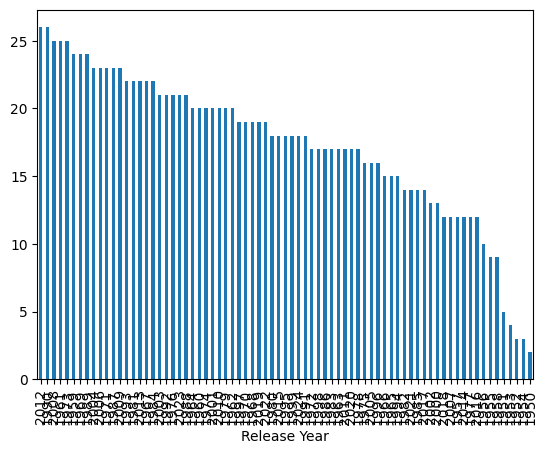

In [ ]:
lyric_df["Release Year"].value_counts().plot.bar()

In [ ]:
from collections import defaultdict

corpus_by_decade = defaultdict(str)

for year, lyrics in corpus_by_year.items():
    if pd.notna(year):  # skip NaNs just in case
        decade = (int(year) // 10) * 10  # e.g., 1994 → 1990
        corpus_by_decade[decade] += ' ' + lyrics  # concatenate lyrics for the decade

# Optional: convert defaultdict to regular dict
corpus_by_decade = dict(corpus_by_decade)

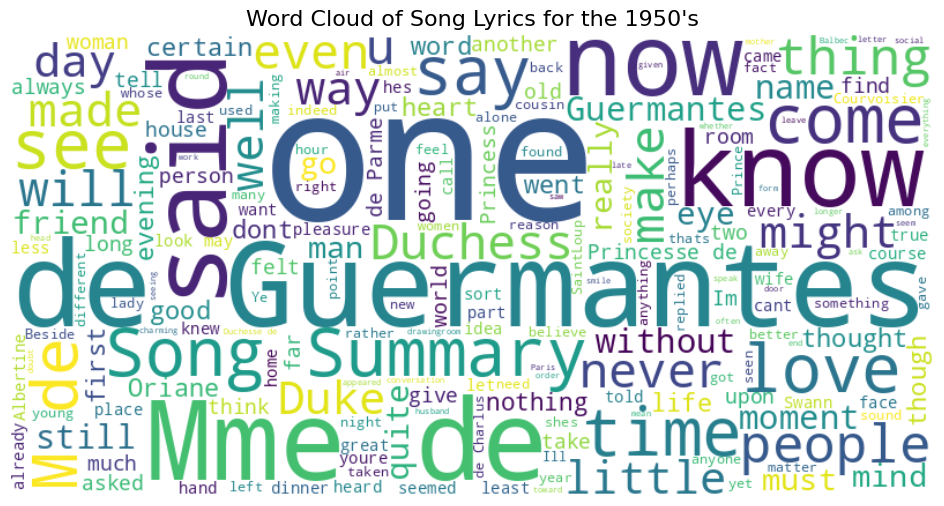

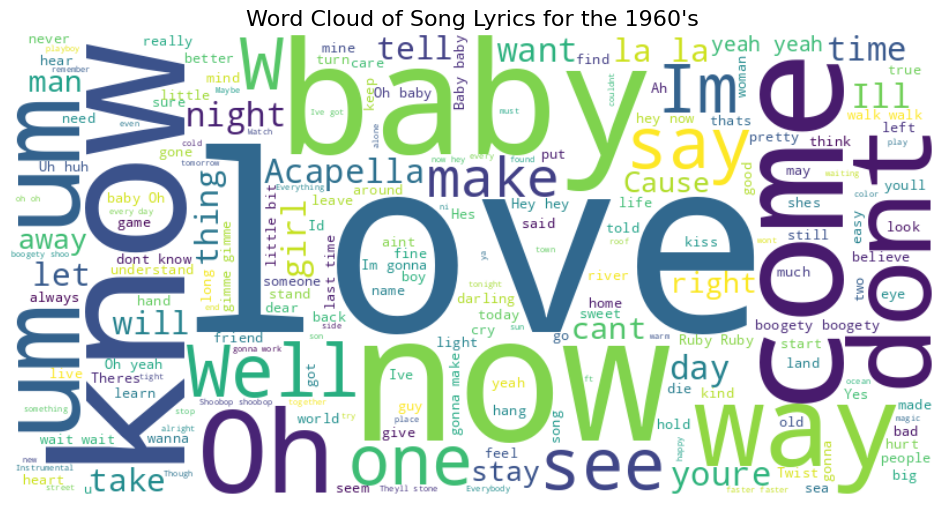

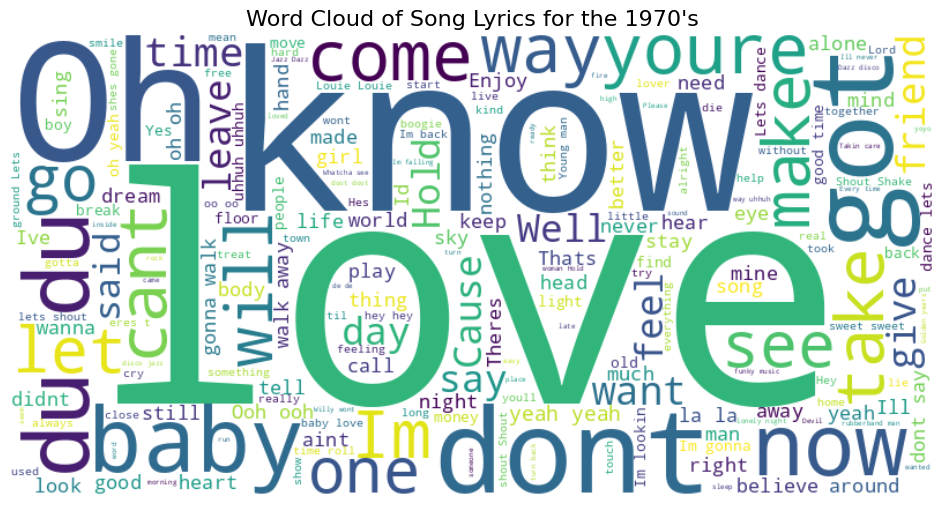

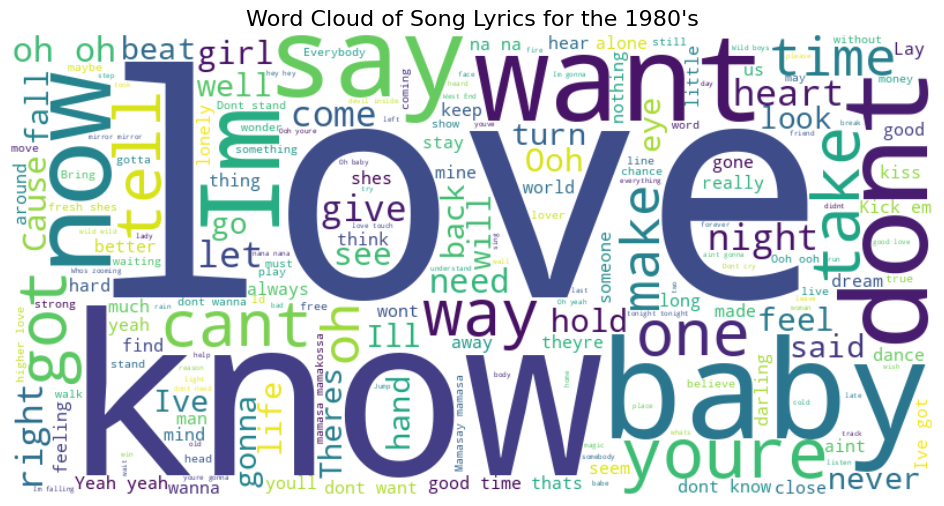

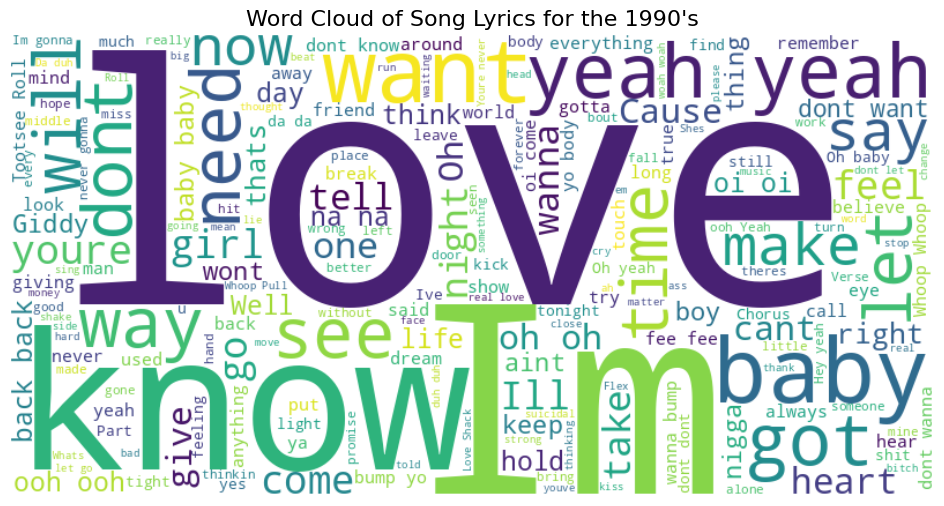

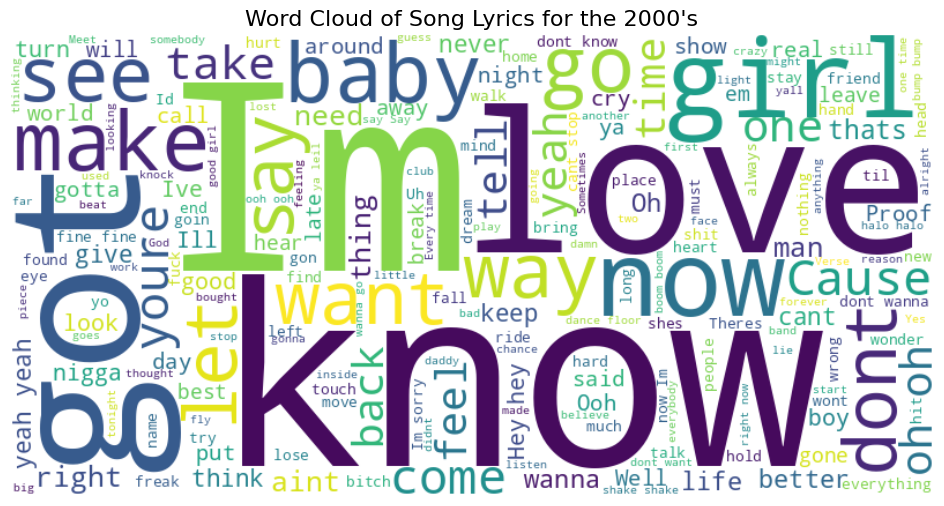

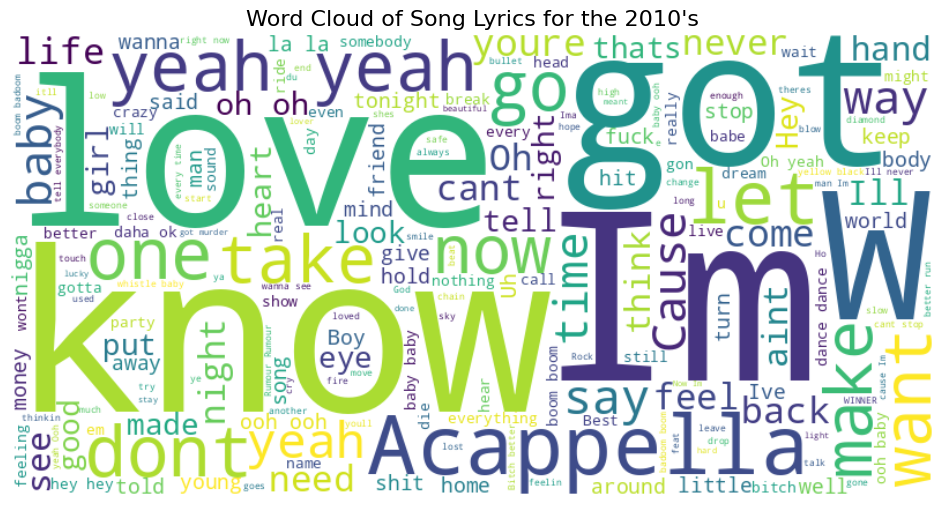

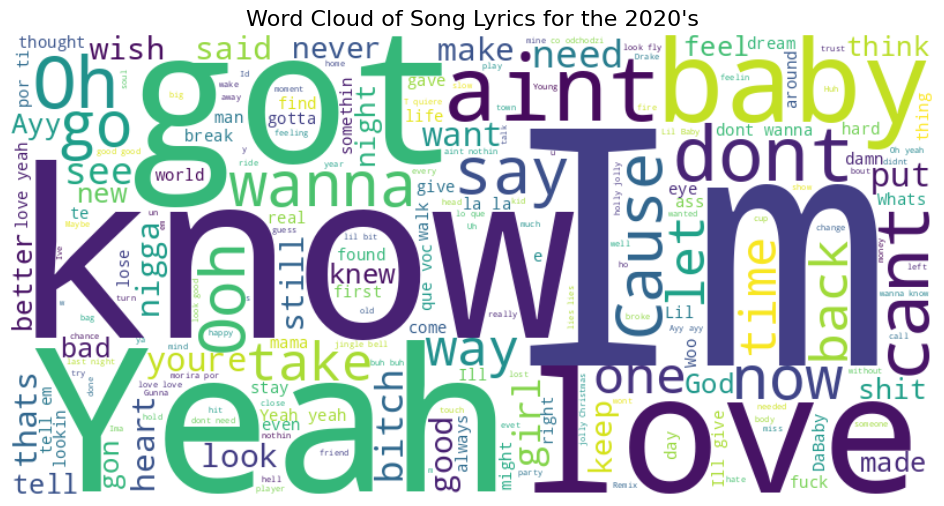

In [ ]:
for decade in corpus_by_decade:

    corpus = corpus_by_decade[decade]

    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='white',
        colormap='viridis',  # or try 'plasma', 'cool', etc.
        max_words=200
    ).generate(corpus)

    # Plot it
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud of Song Lyrics for the {decade}'s", fontsize=16)
    plt.show()

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

# Create a multi-page PDF
with PdfPages("wordclouds_by_decade.pdf") as pdf:
    for decade in sorted(corpus_by_decade):  # sort decades if desired
        corpus = corpus_by_decade[decade]

        wordcloud = WordCloud(
            width=800,
            height=400,
            background_color='white',
            colormap='viridis',
            max_words=200
        ).generate(corpus)

        # Create figure
        plt.figure(figsize=(12, 6))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"Word Cloud of Song Lyrics for the {decade}'s", fontsize=16)

        # Save current figure to the PDF
        pdf.savefig()
        plt.close()  # Close the figure to avoid display and save memory


### "big 8" sentiment analysis

#### sentiment analysis for Lyrics

In [ ]:
# Load the NRC Emotion Lexicon
import requests
import re
from collections import Counter, defaultdict
def load_nrc_lexicon(url):
    emotion_dict = defaultdict(lambda: defaultdict(int))
    response = requests.get(url)
    lines = response.text.strip().split('\n')
    for line in lines:
        word, emotion, score = line.split('\t')
        if int(score) == 1:
            emotion_dict[word][emotion] = 1
    return emotion_dict

nrc = load_nrc_lexicon("https://raw.githubusercontent.com/anyabulchandani/DS112FinalProj/main/NRC-Emotion-Lexicon-Wordlevel-v0.92.txt")

def tokenize(text):
    return re.findall(r"\b\w+\b", text.lower())

def score_emotions(text, lexicon):
    emotion_counts = Counter()
    words = tokenize(text)
    for word in words:
        if word in lexicon:
            for emotion in lexicon[word]:
                emotion_counts[emotion] += 1
    return dict(emotion_counts)

def normalize_scores_by_length(text, emotion_scores):
    total_words = len(tokenize(text))
    return {
        emotion: score / total_words
        for emotion, score in emotion_scores.items()
    } if total_words > 0 else emotion_scores

def normalize_scores_percent_by_length(text, emotion_scores):
    total_words = len(tokenize(text))
    return {
        emotion: (score / total_words) * 100
        for emotion, score in emotion_scores.items()
    } if total_words > 0 else emotion_scores

In [ ]:
import pandas as pd
df = pd.read_csv("https://raw.githubusercontent.com/anyabulchandani/DS112FinalProj/main/Cleaned_Lyrics.csv")

In [ ]:
df

,Unnamed: 0,Title,Artist,Release Year,Genius_Link,Lyrics String
0,0,Goodnight Irene,Gordon Jenkins & The Weavers,1950,https://genius.com/The-weavers-and-gordon-jenk...,Irene goodnight Irene goodnight Goodnight Iren...
1,5,"Music, Music, Music",Teresa Brewer,1950,https://genius.com/Teresa-brewer-music-music-m...,Put another nickel in In the nickelodeon All I...
2,7,Chattanoogie Shoe Shine Boy,Red Foley,1950,https://genius.com/Red-foley-chattanoogie-shoe...,Have you ever passed the corner of Forth and G...
3,8,Harbor Lights,Sammy Kaye,1950,https://genius.com/Sammy-kaye-harbor-lights-ly...,I saw the harbor lights They only told me we w...
4,12,"Tzena, Tzena, Tzena",Gordon Jenkins & The Weavers,1950,https://genius.com/The-weavers-and-gordon-jenk...,Tzena Tzena Tzena Tzena Cant you hear the musi...
...,...,...,...,...,...,...
6392,6926,Wind Up Missin' You,Tucker Wetmore,2024,https://genius.com/Tucker-wetmore-wind-up-miss...,I know I might look like Another ball cap on a...
6393,6927,Bulletproof,Nate Smith,2024,https://genius.com/Nate-smith-bulletproof-lyrics,Usually these ol neon lights Are pretty good f...
6394,6929,The Painter,Cody Johnson,2024,https://genius.com/Cody-johnson-the-painter-ly...,She talks about the future like shes flippin t...
6395,6930,Down Bad,Taylor Swift,2024,https://genius.com/Taylor-swift-down-bad-lyrics,Did you really beam me up In a cloud of sparkl...


In [ ]:
# Step 1: Score each row's lyrics
df["Emotion_Scores"] = df["Lyrics String"].apply(lambda x: score_emotions(str(x), nrc))

# Step 2: Normalize emotion counts by length
df["Normalized_Emotion_Scores"] = df.apply(
    lambda row: normalize_scores_by_length(str(row["Lyrics String"]), row["Emotion_Scores"]),
    axis=1
)

# Optional: normalize to percent (0-100 scale)
df["Emotion_Percent_Scores"] = df.apply(
    lambda row: normalize_scores_percent_by_length(str(row["Lyrics String"]), row["Emotion_Scores"]),
    axis=1
)

In [ ]:
emo_df["Emotion_Percent_Scores"][2000].keys()

NameError: name 'emo_df' is not defined

In [ ]:
import pandas as pd
from collections import Counter, defaultdict
import requests
import re

# Load lexicon
def load_nrc_lexicon(url):
    emotion_dict = defaultdict(lambda: defaultdict(int))
    response = requests.get(url)
    lines = response.text.strip().split('\n')
    for line in lines:
        word, emotion, score = line.split('\t')
        if int(score) == 1:
            emotion_dict[word][emotion] = 1
    return emotion_dict

nrc = load_nrc_lexicon("https://raw.githubusercontent.com/anyabulchandani/DS112FinalProj/main/NRC-Emotion-Lexicon-Wordlevel-v0.92.txt")

# Tokenize text
def tokenize(text):
    return re.findall(r"\b\w+\b", str(text).lower())

# Score emotion counts
def score_emotions(text, lexicon):
    emotion_counts = Counter()
    words = tokenize(text)
    for word in words:
        if word in lexicon:
            for emotion in lexicon[word]:
                emotion_counts[emotion] += 1
    return dict(emotion_counts)

# Normalize to percent
def normalize_scores_percent_by_length(text, emotion_scores):
    total_words = len(tokenize(text))
    return {
        emotion: (score / total_words) * 100
        for emotion, score in emotion_scores.items()
    } if total_words > 0 else {}


In [ ]:
# Apply emotion scoring and percent normalization
emotion_percent_scores = df["Lyrics String"].apply(
    lambda text: normalize_scores_percent_by_length(text, score_emotions(text, nrc))
    # lambda text: score_emotions(text, score_emotions(text, nrc))
)

# Convert the list of dicts into a DataFrame
emotion_df = pd.DataFrame(emotion_percent_scores.tolist())

# Fill missing emotions with 0 and concatenate back
emotion_df = emotion_df.fillna(0)
emo_df = pd.concat([df, emotion_df], axis=1)


In [ ]:
emo_df

,Unnamed: 0,Title,Artist,Release Year,Genius_Link,Lyrics String,Emotion_Scores,Normalized_Emotion_Scores,Emotion_Percent_Scores,anger,disgust,fear,negative,sadness,positive,joy,trust,anticipation,surprise
0,0,Goodnight Irene,Gordon Jenkins & The Weavers,1950,https://genius.com/The-weavers-and-gordon-jenk...,Irene goodnight Irene goodnight Goodnight Iren...,"{'anger': 4, 'disgust': 4, 'fear': 5, 'negativ...","{'anger': 0.031007751937984496, 'disgust': 0.0...","{'anger': 3.10077519379845, 'disgust': 3.10077...",3.100775,3.100775,3.875969,4.651163,4.651163,1.550388,0.775194,0.000000,0.000000,0.000000
1,5,"Music, Music, Music",Teresa Brewer,1950,https://genius.com/Teresa-brewer-music-music-m...,Put another nickel in In the nickelodeon All I...,"{'joy': 29, 'positive': 31, 'sadness': 27, 'tr...","{'joy': 0.13744075829383887, 'positive': 0.146...","{'joy': 13.744075829383887, 'positive': 14.691...",0.000000,0.000000,0.000000,0.000000,12.796209,14.691943,13.744076,0.947867,0.000000,0.000000
2,7,Chattanoogie Shoe Shine Boy,Red Foley,1950,https://genius.com/Red-foley-chattanoogie-shoe...,Have you ever passed the corner of Forth and G...,"{'positive': 11, 'anticipation': 3, 'joy': 7, ...","{'positive': 0.04700854700854701, 'anticipatio...","{'positive': 4.700854700854701, 'anticipation'...",0.000000,0.000000,0.000000,0.854701,0.000000,4.700855,2.991453,1.282051,1.282051,0.854701
3,8,Harbor Lights,Sammy Kaye,1950,https://genius.com/Sammy-kaye-harbor-lights-ly...,I saw the harbor lights They only told me we w...,"{'trust': 6, 'sadness': 5, 'joy': 5, 'positive...","{'trust': 0.043478260869565216, 'sadness': 0.0...","{'trust': 4.3478260869565215, 'sadness': 3.623...",2.898551,1.449275,2.898551,2.898551,3.623188,4.347826,3.623188,4.347826,4.347826,1.449275
4,12,"Tzena, Tzena, Tzena",Gordon Jenkins & The Weavers,1950,https://genius.com/The-weavers-and-gordon-jenk...,Tzena Tzena Tzena Tzena Cant you hear the musi...,"{'joy': 13, 'positive': 15, 'sadness': 5, 'ant...","{'joy': 0.04318936877076412, 'positive': 0.049...","{'joy': 4.318936877076411, 'positive': 4.98338...",0.000000,0.000000,0.000000,0.000000,1.661130,4.983389,4.318937,2.657807,1.328904,1.328904
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6392,6926,Wind Up Missin' You,Tucker Wetmore,2024,https://genius.com/Tucker-wetmore-wind-up-miss...,I know I might look like Another ball cap on a...,"{'anticipation': 5, 'trust': 9, 'positive': 13...","{'anticipation': 0.01483679525222552, 'trust':...","{'anticipation': 1.483679525222552, 'trust': 2...",0.593472,0.593472,1.186944,2.077151,1.483680,3.857567,1.186944,2.670623,1.483680,0.890208
6393,6927,Bulletproof,Nate Smith,2024,https://genius.com/Nate-smith-bulletproof-lyrics,Usually these ol neon lights Are pretty good f...,"{'anticipation': 6, 'joy': 15, 'positive': 21,...","{'anticipation': 0.02027027027027027, 'joy': 0...","{'anticipation': 2.027027027027027, 'joy': 5.0...",0.675676,0.337838,2.364865,2.364865,1.689189,7.094595,5.067568,1.689189,2.027027,1.351351
6394,6929,The Painter,Cody Johnson,2024,https://genius.com/Cody-johnson-the-painter-ly...,She talks about the future like shes flippin t...,"{'joy': 9, 'positive': 11, 'anger': 3, 'fear':...","{'joy': 0.03435114503816794, 'positive': 0.041...","{'joy': 3.435114503816794, 'positive': 4.19847...",1.145038,0.000000,2.671756,1.908397,1.908397,4.198473,3.435115,1.908397,3.053435,0.763359
6395,6930,Down Bad,Taylor Swift,2024,https://genius.com/Taylor-swift-down-bad-lyrics,Did you really beam me up In a cloud of sparkl...,"{'joy': 6, 'positive': 19, 'negative': 28, 'an...","{'joy': 0.012711864406779662, 'positive': 0.04...","{'joy': 1.2711864406779663, 'positive': 4.0254...",3.601695,3.813559,4.237288,5.932203,5.084746,4.025424,1.271186,1.059322,1.271186,0.211864


In [ ]:
subset_df = emo_df.loc[:, ["Release Year"] + list(df.loc[:, "anger":"surprise"].columns)]
mean_df = subset_df.groupby("Release Year").mean(numeric_only=True)
mean_df

KeyError: 'anger'

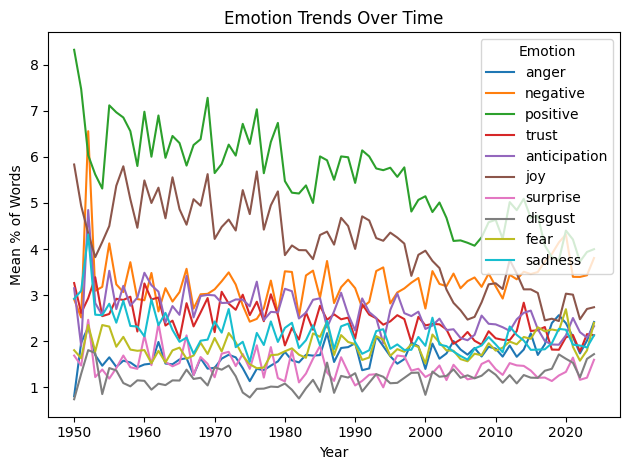

In [ ]:
import matplotlib.pyplot as plt

# Optional: set figure size
plt.figure()

# Plot each emotion with label
for emotion in df["Emotion_Percent_Scores"][2000].keys():
    df.groupby("Release Year")[emotion].mean().plot(label=emotion)

# Add legend and labels
plt.legend(title="Emotion")
plt.xlabel("Year")
plt.ylabel("Mean % of Words")
plt.title("Emotion Trends Over Time")
plt.tight_layout()
plt.show()

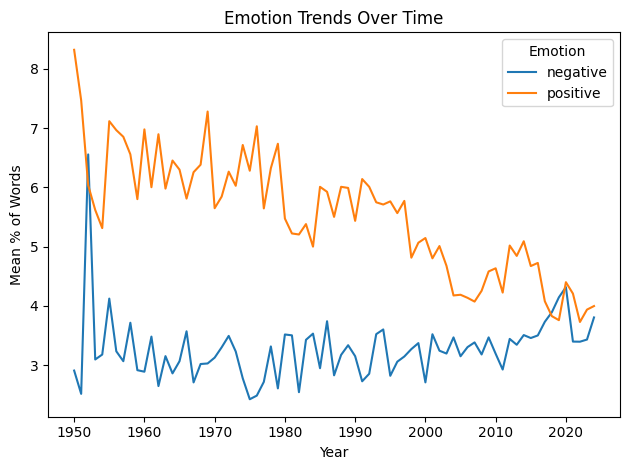

In [ ]:
import matplotlib.pyplot as plt

# Optional: set figure size
plt.figure()

# Plot each emotion with label
for emotion in ["negative", "positive"]:
    df.groupby("Release Year")[emotion].mean().plot(label=emotion)

# Add legend and labels
plt.legend(title="Emotion")
plt.xlabel("Year")
plt.ylabel("Mean % of Words")
plt.title("Emotion Trends Over Time")
plt.tight_layout()
plt.show()

#### sentiment analysis for State of the Union addresses

##### Extract Text

In [ ]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

# Starting URL (replace this with the actual URL)
base_url = "https://www.presidency.ucsb.edu"
index_url = base_url + "/documents/app-categories/spoken-addresses-and-remarks/presidential/state-the-union-addresses?items_per_page=100"  # Replace with actual page URL

# Get the main page
res = requests.get(index_url)
soup = BeautifulSoup(res.text, 'html.parser')

In [ ]:
# Find all rows that have date and title information
data = []

# Find all rows that have date and title information
rows = soup.find_all('div', class_='row')

for row in rows:
    # Get the date span within this row
    date_span = row.find('span', class_='date-display-single')
    year = date_span['content'][:4] if date_span and 'content' in date_span.attrs else None

    if (int(year) >= 1950):
        # Get the first link within field-title within this row
        field_title_div = row.find('div', class_='field-title')
        link = field_title_div.find('a')['href'] if field_title_div and field_title_div.find('a') else None

        data.append({'Year': year, 'Link': link})

# Create DataFrame
df_sou = pd.DataFrame(data)

df_sou

,Year,Link
0,2024,/documents/address-before-joint-session-the-co...
1,2024,/documents/address-before-joint-session-the-co...
2,2023,/documents/address-before-joint-session-the-co...
3,2022,/documents/address-before-joint-session-the-co...
4,2020,/documents/address-before-joint-session-the-co...
...,...,...
62,1954,/documents/annual-message-the-congress-the-sta...
63,1953,/documents/annual-message-the-congress-the-sta...
64,1952,/documents/annual-message-the-congress-the-sta...
65,1951,/documents/annual-message-the-congress-the-sta...


In [ ]:
def get_state_of_union_text(link):
    url = base_url + link
    res = requests.get(url)
    soup = BeautifulSoup(res.text, 'html.parser')
    speech_html = soup.find('div', class_= 'field-docs-content')
    lines = speech_html.find_all('p')
    all_text = ' '.join(line.get_text(separator=' ', strip=True) for line in lines)
    return all_text

In [ ]:
df_sou["Text"] = df_sou["Link"].apply(get_state_of_union_text)
df_sou

,Year,Link,Text
0,2024,/documents/address-before-joint-session-the-co...,"[ Before speaking, the President presented his..."
1,2024,/documents/address-before-joint-session-the-co...,"[ Before speaking, the President presented his..."
2,2023,/documents/address-before-joint-session-the-co...,"The President. Mr. Speaker—— [ At this point, ..."
3,2022,/documents/address-before-joint-session-the-co...,"The President. Thank you all very, very much. ..."
4,2020,/documents/address-before-joint-session-the-co...,The President. Thank you very much. Thank you....
...,...,...,...
62,1954,/documents/annual-message-the-congress-the-sta...,"Mr. President, Mr. Speaker, Members of the Eig..."
63,1953,/documents/annual-message-the-congress-the-sta...,"Mr. President, Mr. Speaker, Members of the Eig..."
64,1952,/documents/annual-message-the-congress-the-sta...,"Mr. President, Mr. Speaker, Members of the Con..."
65,1951,/documents/annual-message-the-congress-the-sta...,"Mr. President, Mr. Speaker, Members of the Con..."


##### Sentiment Analysis

In [ ]:
df_sou["Emotion_Scores"] = df_sou["Text"].apply(lambda x: score_emotions(str(x), nrc))

In [ ]:
def normalize_scores_percent_by_length(text, emotion_scores):
    total_words = len(tokenize(text))
    return {
        emotion: (score / total_words) * 100
        for emotion, score in emotion_scores.items()
    } if total_words > 0 else {}

In [ ]:
df_sou["Emotion_Percent_Scores"] = df_sou.apply(
    lambda row: normalize_scores_percent_by_length(str(row["Text"]), row["Emotion_Scores"]),
    axis=1
)

In [ ]:
emotion_df = pd.DataFrame(df_sou["Emotion_Percent_Scores"].tolist())
emotion_df = emotion_df.fillna(0)
df_sou = pd.concat([df_sou, emotion_df], axis=1)

In [ ]:
df_sou = df_sou.sort_values("Year")

In [ ]:
df_sou["Year"] = df_sou["Year"].apply(lambda x: int(x))

In [ ]:
df_sou["Emotion_Scores"][0].keys()

dict_keys(['positive', 'trust', 'anticipation', 'joy', 'surprise', 'negative', 'disgust', 'fear', 'anger', 'sadness'])

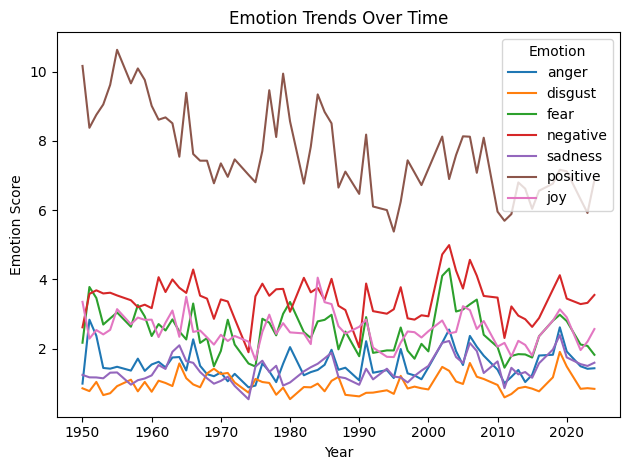

In [ ]:
import matplotlib.pyplot as plt

# Extract list of emotion column names
# emotion_columns = list(df_sou["Emotion_Scores"][0].keys())

emotion_columns = ["anger", "disgust", "fear", "negative", "sadness", "positive", "joy"]

xticks = list(range(1950, int(df_sou["Year"].max()) + 1, 10))


# Plot all emotion trends on the same plot
df_sou.plot(x="Year", y=emotion_columns)

# Add title, labels, legend
plt.title("Emotion Trends Over Time")
plt.xlabel("Year")
plt.ylabel("Emotion Score")
plt.legend(title="Emotion")

plt.xticks(xticks)

plt.tight_layout()
plt.show()


In [ ]:
df_sou

,Year,Link,Text,Emotion_Scores,Emotion_Percent_Scores,positive,trust,anticipation,joy,surprise,negative,disgust,fear,anger,sadness
66,1950,/documents/annual-message-the-congress-the-sta...,"Mr. President, Mr. Speaker, Members of the Con...","{'positive': 525, 'trust': 345, 'disgust': 44,...","{'positive': 10.168506682161533, 'trust': 6.68...",10.168507,6.682162,3.621925,3.350765,1.123378,2.614759,0.852218,2.169281,0.987798,1.239589
65,1951,/documents/annual-message-the-congress-the-sta...,"Mr. President, Mr. Speaker, Members of the Con...","{'positive': 337, 'trust': 194, 'disgust': 31,...","{'positive': 8.380999751305646, 'trust': 4.824...",8.381000,4.824670,3.158418,2.287988,1.069386,3.581199,0.770952,3.780154,2.835116,1.168863
64,1952,/documents/annual-message-the-congress-the-sta...,"Mr. President, Mr. Speaker, Members of the Con...","{'positive': 473, 'trust': 279, 'disgust': 56,...","{'positive': 8.756016290262865, 'trust': 5.164...",8.756016,5.164754,3.646797,2.536098,1.147723,3.683821,1.036653,3.461681,2.369493,1.166235
63,1953,/documents/annual-message-the-congress-the-sta...,"Mr. President, Mr. Speaker, Members of the Eig...","{'positive': 635, 'trust': 494, 'disgust': 46,...","{'positive': 9.054612861828033, 'trust': 7.044...",9.054613,7.044061,3.108513,2.409810,1.069442,3.593327,0.655925,2.694995,1.440183,1.140739
62,1954,/documents/annual-message-the-congress-the-sta...,"Mr. President, Mr. Speaker, Members of the Eig...","{'positive': 583, 'trust': 404, 'disgust': 43,...","{'positive': 9.622049843208451, 'trust': 6.667...",9.622050,6.667767,3.680475,2.541674,0.990262,3.614458,0.709688,2.871761,1.419376,1.303846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,2020,/documents/address-before-joint-session-the-co...,The President. Thank you very much. Thank you....,"{'positive': 461, 'trust': 333, 'negative': 22...","{'positive': 7.120790855730615, 'trust': 5.143...",7.120791,5.143652,3.181959,2.903923,1.343837,3.444547,1.482854,2.795799,1.915354,1.745443
3,2022,/documents/address-before-joint-session-the-co...,"The President. Thank you all very, very much. ...","{'positive': 513, 'trust': 363, 'negative': 26...","{'positive': 6.314623338257016, 'trust': 4.468...",6.314623,4.468242,2.831118,1.957164,0.972427,3.286558,0.837026,2.117184,1.489414,1.550960
2,2023,/documents/address-before-joint-session-the-co...,"The President. Mr. Speaker—— [ At this point, ...","{'positive': 581, 'trust': 410, 'anticipation'...","{'positive': 5.920114122681883, 'trust': 4.177...",5.920114,4.177705,2.700224,2.200937,1.080090,3.321785,0.855920,2.078663,1.416344,1.497860
1,2024,/documents/address-before-joint-session-the-co...,"[ Before speaking, the President presented his...","{'positive': 600, 'trust': 422, 'anticipation'...","{'positive': 6.871278057718736, 'trust': 4.832...",6.871278,4.832799,2.885937,2.565277,1.442968,3.550160,0.836005,1.820889,1.431516,1.591846


In [ ]:
subset_df_sou = df_sou.loc[:, ["Year"] + list(df_sou.loc[:, "positive":"sadness"].columns)]
mean_df_sou = subset_df_sou.groupby("Year").mean(numeric_only=True)
mean_df_sou

,positive,trust,anticipation,joy,surprise,negative,disgust,fear,anger,sadness
Year,,,,,,,,,,
1950,10.168507,6.682162,3.621925,3.350765,1.123378,2.614759,0.852218,2.169281,0.987798,1.239589
1951,8.381000,4.824670,3.158418,2.287988,1.069386,3.581199,0.770952,3.780154,2.835116,1.168863
1952,8.756016,5.164754,3.646797,2.536098,1.147723,3.683821,1.036653,3.461681,2.369493,1.166235
1953,9.054613,7.044061,3.108513,2.409810,1.069442,3.593327,0.655925,2.694995,1.440183,1.140739
1954,9.622050,6.667767,3.680475,2.541674,0.990262,3.614458,0.709688,2.871761,1.419376,1.303846
...,...,...,...,...,...,...,...,...,...,...
2019,7.167590,4.830332,3.393352,3.133657,1.696676,4.120499,1.904432,2.977839,2.614266,2.389197
2020,7.120791,5.143652,3.181959,2.903923,1.343837,3.444547,1.482854,2.795799,1.915354,1.745443
2022,6.314623,4.468242,2.831118,1.957164,0.972427,3.286558,0.837026,2.117184,1.489414,1.550960


In [ ]:
mean_df

,anger,disgust,fear,negative,sadness,positive,joy,trust,anticipation,surprise
Release Year,,,,,,,,,,
1950,0.806113,0.739271,1.803542,2.907021,2.920556,8.324095,5.834628,3.261403,3.149115,1.687746
1951,1.966727,1.291338,1.629808,2.514249,3.092787,7.470992,4.937109,2.612074,1.897176,1.471625
1952,2.304667,1.805755,2.349911,6.557106,4.316023,6.035773,4.345307,2.932387,4.846172,2.463659
1953,1.700255,1.741676,1.776985,3.094340,2.574193,5.619311,3.823855,3.388439,2.827717,1.220160
1954,1.466768,0.851022,2.349732,3.177640,2.564355,5.312747,4.152410,2.543146,2.563834,1.384425
...,...,...,...,...,...,...,...,...,...,...
2020,2.390605,1.617771,2.694218,4.315581,2.248405,4.399697,3.030979,2.084571,2.125728,1.333365
2021,2.091897,1.531361,1.876798,3.396494,1.924008,4.206807,3.009370,2.134471,2.502577,1.643405
2022,1.734350,1.213703,1.576158,3.394507,1.904404,3.727824,2.475703,1.775728,2.195944,1.161321


In [ ]:
mean_df_sou

,positive,trust,anticipation,joy,surprise,negative,disgust,fear,anger,sadness
Year,,,,,,,,,,
1950,10.168507,6.682162,3.621925,3.350765,1.123378,2.614759,0.852218,2.169281,0.987798,1.239589
1951,8.381000,4.824670,3.158418,2.287988,1.069386,3.581199,0.770952,3.780154,2.835116,1.168863
1952,8.756016,5.164754,3.646797,2.536098,1.147723,3.683821,1.036653,3.461681,2.369493,1.166235
1953,9.054613,7.044061,3.108513,2.409810,1.069442,3.593327,0.655925,2.694995,1.440183,1.140739
1954,9.622050,6.667767,3.680475,2.541674,0.990262,3.614458,0.709688,2.871761,1.419376,1.303846
...,...,...,...,...,...,...,...,...,...,...
2019,7.167590,4.830332,3.393352,3.133657,1.696676,4.120499,1.904432,2.977839,2.614266,2.389197
2020,7.120791,5.143652,3.181959,2.903923,1.343837,3.444547,1.482854,2.795799,1.915354,1.745443
2022,6.314623,4.468242,2.831118,1.957164,0.972427,3.286558,0.837026,2.117184,1.489414,1.550960


#### Merge sentiment from Lyrics and SoU addresses by year

In [ ]:

df1 = mean_df.reset_index().rename(columns={"Release Year": "Year"})
df2 = mean_df_sou.reset_index()

# Merge on 'Year'
merged_df = pd.merge(df1, df2, on="Year", suffixes=("_lyrics", "_stateofunion"))
merged_df

,Year,anger_lyrics,disgust_lyrics,fear_lyrics,negative_lyrics,sadness_lyrics,positive_lyrics,joy_lyrics,trust_lyrics,anticipation_lyrics,...,positive_stateofunion,trust_stateofunion,anticipation_stateofunion,joy_stateofunion,surprise_stateofunion,negative_stateofunion,disgust_stateofunion,fear_stateofunion,anger_stateofunion,sadness_stateofunion
0,1950,0.806113,0.739271,1.803542,2.907021,2.920556,8.324095,5.834628,3.261403,3.149115,...,10.168507,6.682162,3.621925,3.350765,1.123378,2.614759,0.852218,2.169281,0.987798,1.239589
1,1951,1.966727,1.291338,1.629808,2.514249,3.092787,7.470992,4.937109,2.612074,1.897176,...,8.381000,4.824670,3.158418,2.287988,1.069386,3.581199,0.770952,3.780154,2.835116,1.168863
2,1952,2.304667,1.805755,2.349911,6.557106,4.316023,6.035773,4.345307,2.932387,4.846172,...,8.756016,5.164754,3.646797,2.536098,1.147723,3.683821,1.036653,3.461681,2.369493,1.166235
3,1953,1.700255,1.741676,1.776985,3.094340,2.574193,5.619311,3.823855,3.388439,2.827717,...,9.054613,7.044061,3.108513,2.409810,1.069442,3.593327,0.655925,2.694995,1.440183,1.140739
4,1954,1.466768,0.851022,2.349732,3.177640,2.564355,5.312747,4.152410,2.543146,2.563834,...,9.622050,6.667767,3.680475,2.541674,0.990262,3.614458,0.709688,2.871761,1.419376,1.303846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,2019,2.564038,1.713080,2.226504,4.143834,2.267413,3.758434,2.436875,1.814137,1.923366,...,7.167590,4.830332,3.393352,3.133657,1.696676,4.120499,1.904432,2.977839,2.614266,2.389197
62,2020,2.390605,1.617771,2.694218,4.315581,2.248405,4.399697,3.030979,2.084571,2.125728,...,7.120791,5.143652,3.181959,2.903923,1.343837,3.444547,1.482854,2.795799,1.915354,1.745443
63,2022,1.734350,1.213703,1.576158,3.394507,1.904404,3.727824,2.475703,1.775728,2.195944,...,6.314623,4.468242,2.831118,1.957164,0.972427,3.286558,0.837026,2.117184,1.489414,1.550960
64,2023,2.013143,1.615778,1.800215,3.430791,1.862842,3.936289,2.698835,2.152398,2.078699,...,5.920114,4.177705,2.700224,2.200937,1.080090,3.321785,0.855920,2.078663,1.416344,1.497860


In [ ]:
emotion_cols = ["anger", "disgust", "fear", "negative", "sadness",
                "positive", "joy", "trust", "anticipation", "surprise"]

for emotion in emotion_cols:
    col_main = f"{emotion}_lyrics"
    col_sou = f"{emotion}_stateofunion"
    merged_df[f"{emotion}_diff"] = merged_df[col_main] - merged_df[col_sou]


In [ ]:
merged_df

,Year,anger_lyrics,disgust_lyrics,fear_lyrics,negative_lyrics,sadness_lyrics,positive_lyrics,joy_lyrics,trust_lyrics,anticipation_lyrics,...,anger_diff,disgust_diff,fear_diff,negative_diff,sadness_diff,positive_diff,joy_diff,trust_diff,anticipation_diff,surprise_diff
0,1950,0.806113,0.739271,1.803542,2.907021,2.920556,8.324095,5.834628,3.261403,3.149115,...,-0.181685,-0.112947,-0.365739,0.292262,1.680967,-1.844412,2.483863,-3.420758,-0.472811,0.564368
1,1951,1.966727,1.291338,1.629808,2.514249,3.092787,7.470992,4.937109,2.612074,1.897176,...,-0.868389,0.520385,-2.150346,-1.066950,1.923923,-0.910008,2.649121,-2.212596,-1.261242,0.402240
2,1952,2.304667,1.805755,2.349911,6.557106,4.316023,6.035773,4.345307,2.932387,4.846172,...,-0.064826,0.769102,-1.111770,2.873285,3.149788,-2.720244,1.809209,-2.232366,1.199374,1.315936
3,1953,1.700255,1.741676,1.776985,3.094340,2.574193,5.619311,3.823855,3.388439,2.827717,...,0.260073,1.085751,-0.918010,-0.498987,1.433454,-3.435302,1.414045,-3.655622,-0.280796,0.150717
4,1954,1.466768,0.851022,2.349732,3.177640,2.564355,5.312747,4.152410,2.543146,2.563834,...,0.047392,0.141334,-0.522029,-0.436818,1.260510,-4.309303,1.610737,-4.124621,-1.116641,0.394163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,2019,2.564038,1.713080,2.226504,4.143834,2.267413,3.758434,2.436875,1.814137,1.923366,...,-0.050228,-0.191352,-0.751335,0.023335,-0.121784,-3.409156,-0.696781,-3.016195,-1.469986,-0.441599
62,2020,2.390605,1.617771,2.694218,4.315581,2.248405,4.399697,3.030979,2.084571,2.125728,...,0.475252,0.134916,-0.101580,0.871034,0.502962,-2.721094,0.127055,-3.059080,-1.056231,-0.010472
63,2022,1.734350,1.213703,1.576158,3.394507,1.904404,3.727824,2.475703,1.775728,2.195944,...,0.244936,0.376677,-0.541026,0.107948,0.353444,-2.586800,0.518540,-2.692515,-0.635174,0.188893
64,2023,2.013143,1.615778,1.800215,3.430791,1.862842,3.936289,2.698835,2.152398,2.078699,...,0.596799,0.759858,-0.278448,0.109006,0.364981,-1.983825,0.497897,-2.025307,-0.621525,0.127184


##### Correlation Task

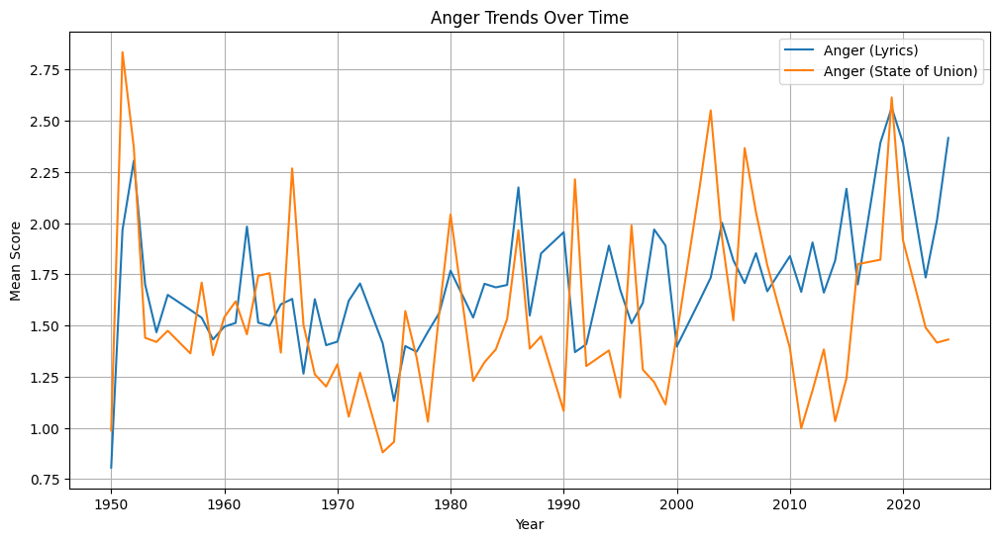

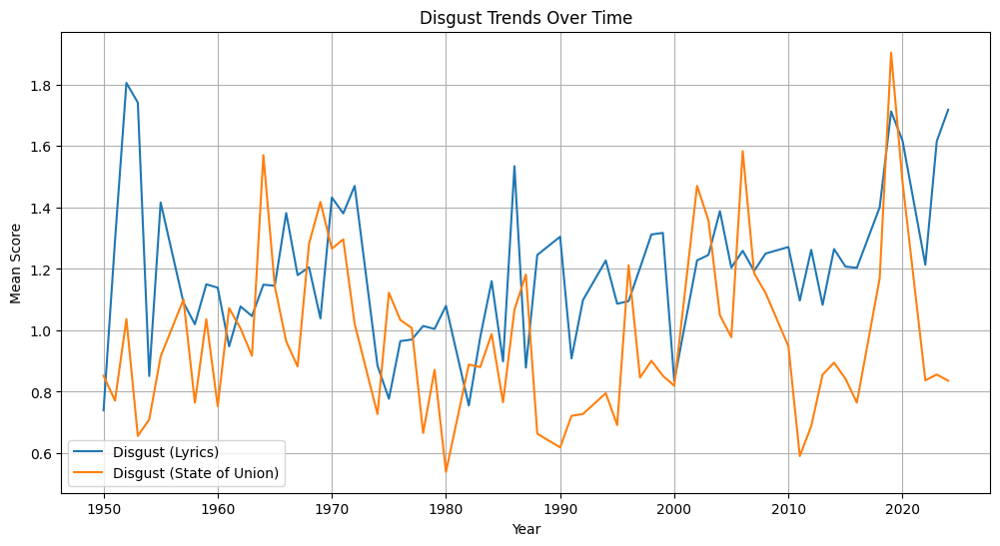

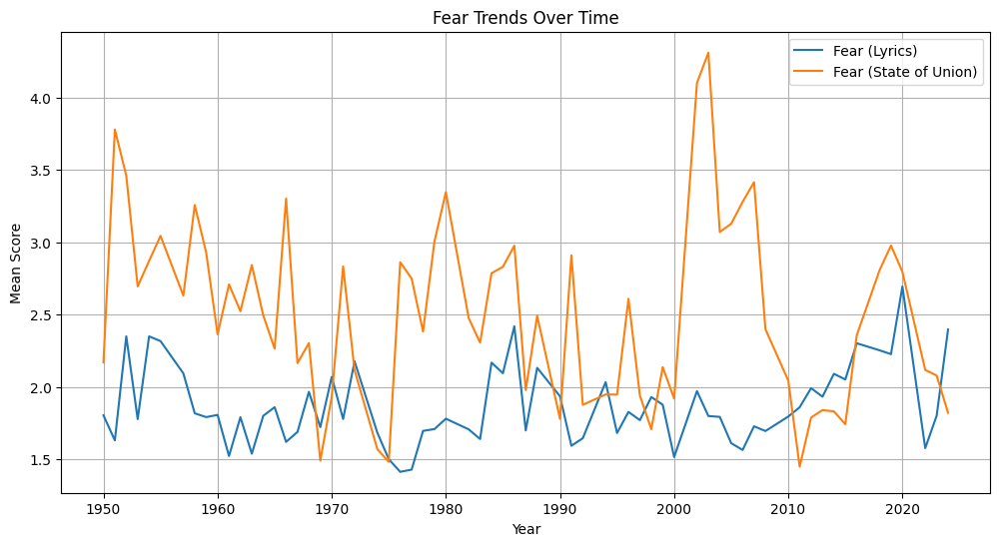

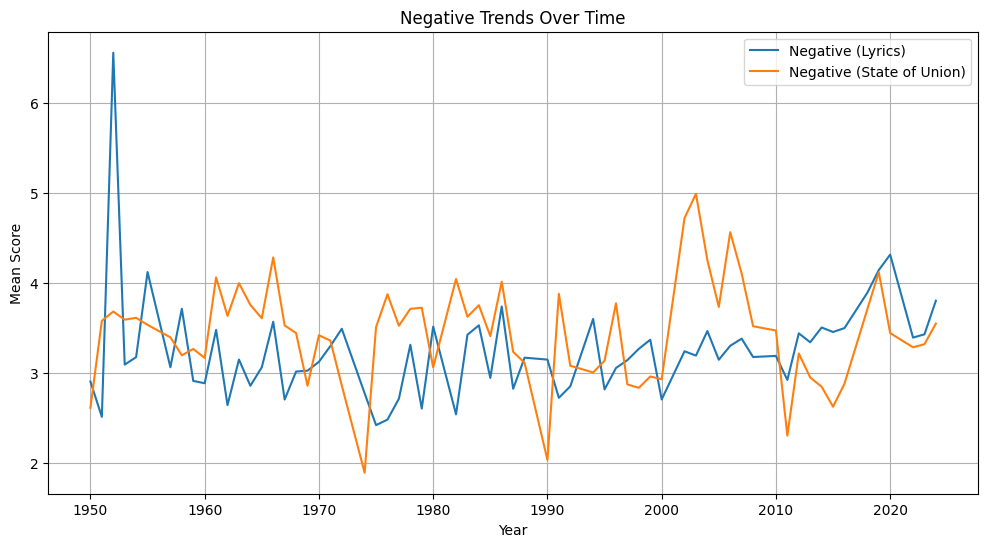

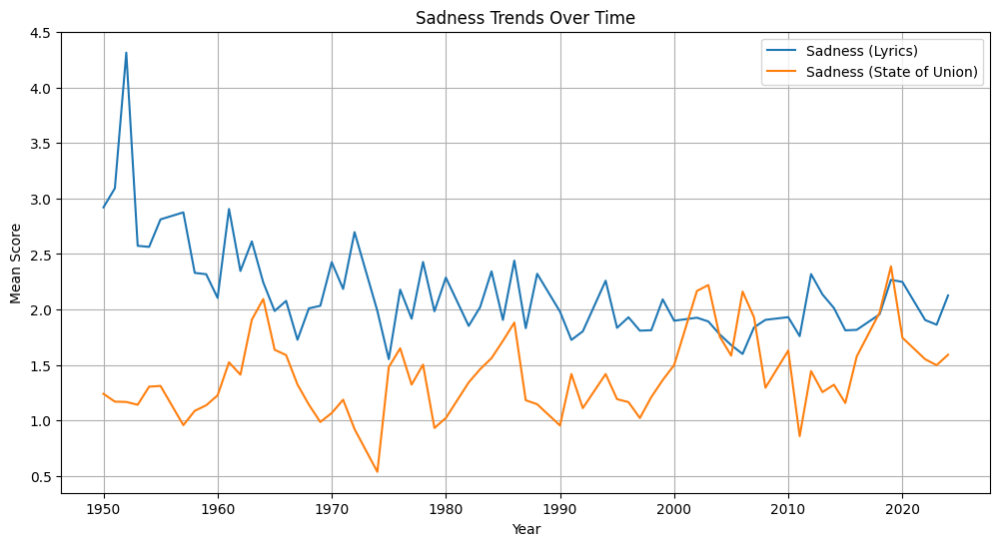

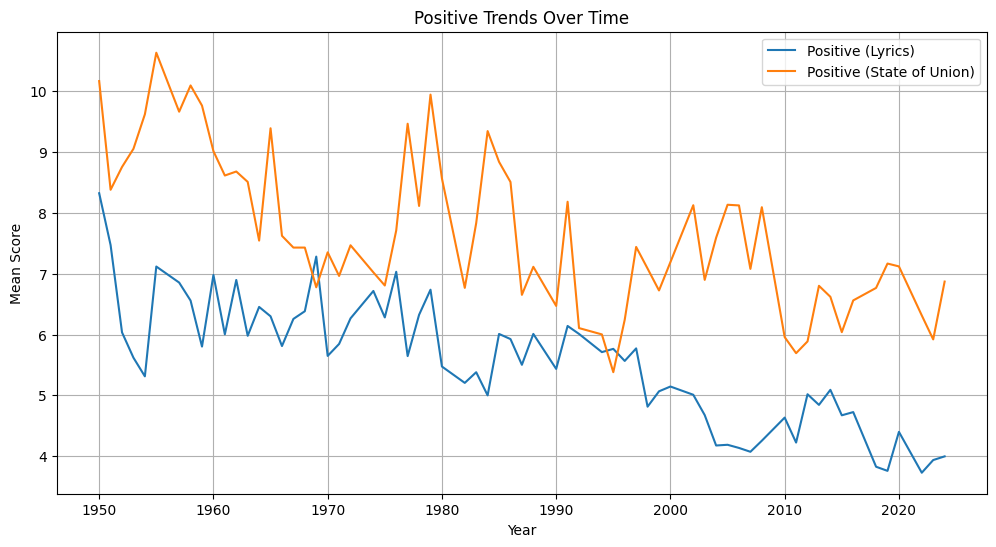

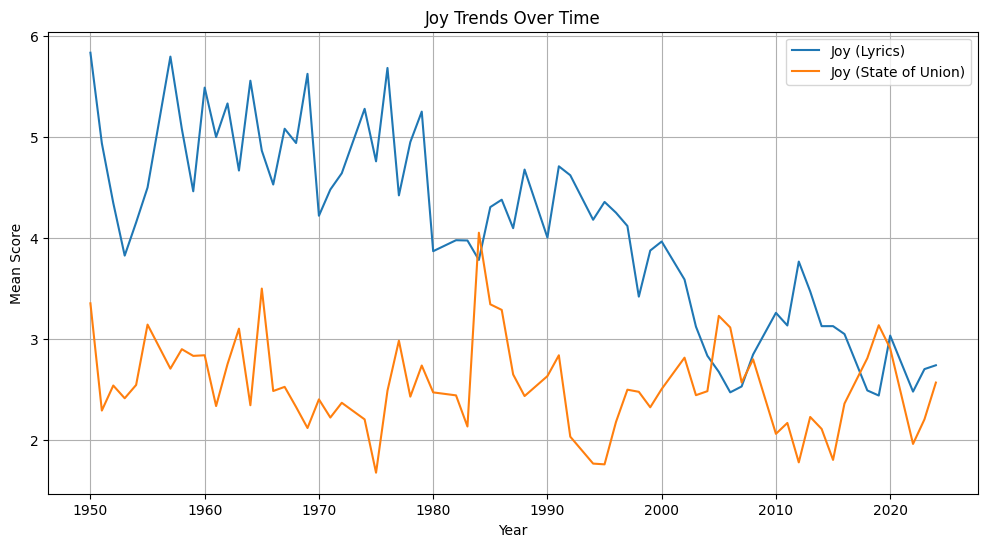

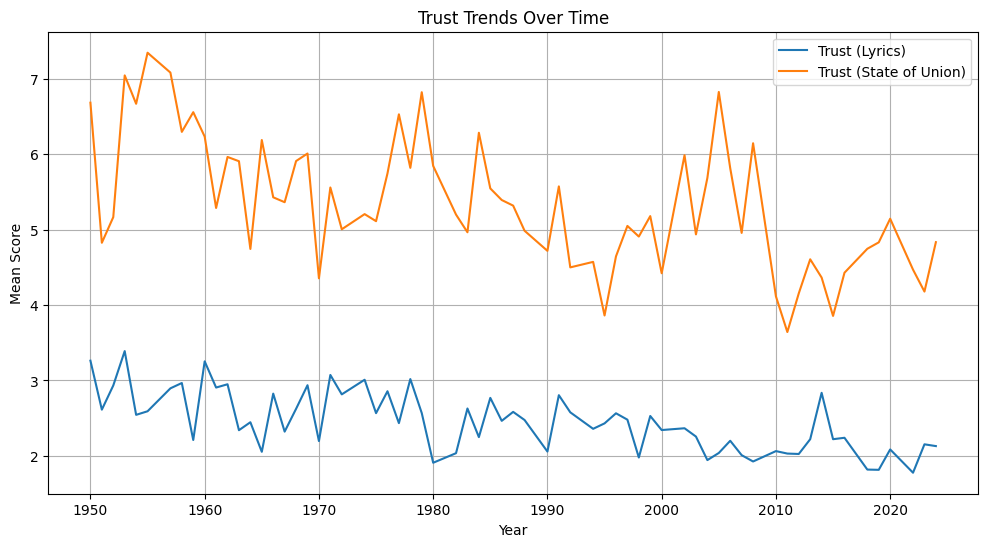

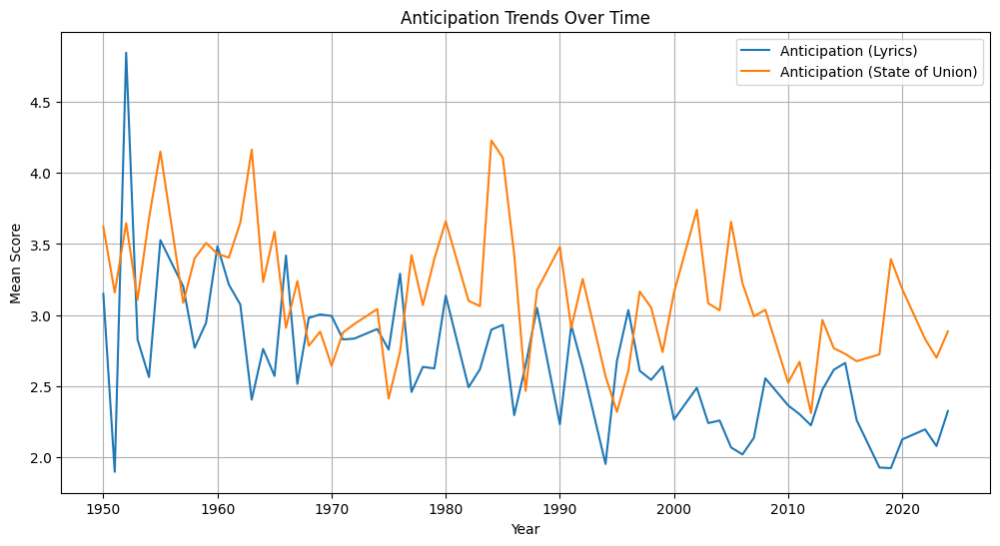

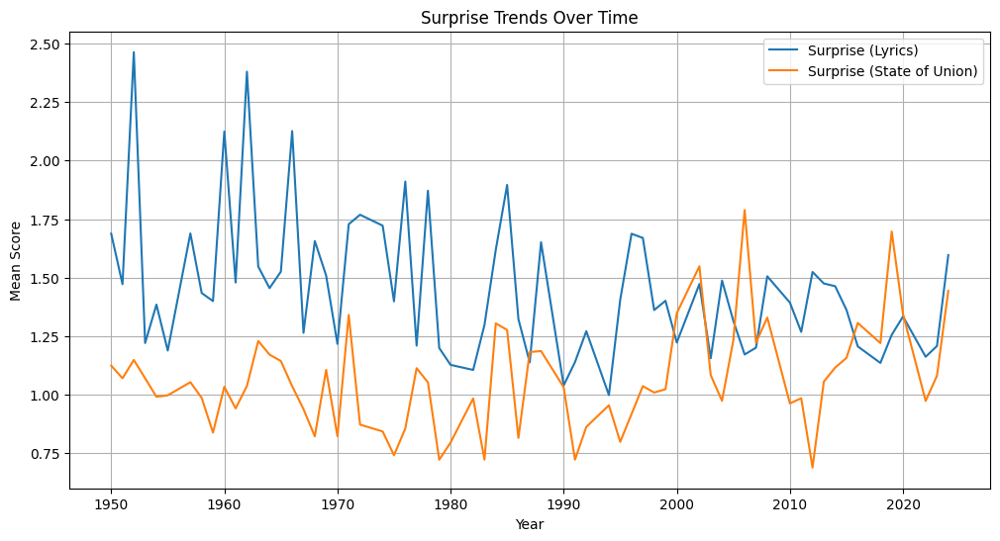

In [ ]:
import matplotlib.pyplot as plt

for emotion in emotion_cols:

    plt.figure(figsize=(12, 6))
    plt.plot(merged_df["Year"], merged_df[emotion + "_lyrics"], label=f"{emotion.capitalize()} (Lyrics)")
    plt.plot(merged_df["Year"], merged_df[emotion + "_stateofunion"], label=f"{emotion.capitalize()} (State of Union)")
    # plt.plot(merged_df["Year"], merged_df[emotion + "_diff"], label="Difference")
    plt.title(f"{emotion.capitalize()} Trends Over Time")
    plt.xlabel("Year")
    plt.ylabel("Mean Score")
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
from matplotlib.backends.backend_pdf import PdfPages

with PdfPages("emotion_trend_comparison.pdf") as pdf:

    for emotion in emotion_cols:

        plt.figure(figsize=(12, 6))
        plt.plot(merged_df["Year"], merged_df[emotion + "_lyrics"], label=f"{emotion.capitalize()} (Lyrics)")
        plt.plot(merged_df["Year"], merged_df[emotion + "_stateofunion"], label=f"{emotion.capitalize()} (State of Union)")
        # plt.plot(merged_df["Year"], merged_df[emotion + "_diff"], label="Difference")
        plt.title(f"{emotion.capitalize()} Trends Over Time")
        plt.xlabel("Year")
        plt.ylabel("Mean Score")
        plt.legend()
        plt.grid(True)

        pdf.savefig()
        plt.close()

In [ ]:
import pandas as pd

# List of emotions
emotion_cols = ["anger", "disgust", "fear", "negative", "sadness",
                "positive", "joy", "trust", "anticipation", "surprise"]

# Compute correlations between lyrics and State of Union for each emotion
correlation_data = {
    emotion: merged_df[f"{emotion}_lyrics"].corr(merged_df[f"{emotion}_stateofunion"])
    for emotion in emotion_cols
}

# Create DataFrame from dictionary
correlation_df = pd.DataFrame.from_dict(correlation_data, orient='index', columns=['Correlation'])
correlation_df = correlation_df.sort_values(by="Correlation", ascending=False)
print(correlation_df)


              Correlation
positive         0.492359
trust            0.385555
anger            0.364896
disgust          0.248565
anticipation     0.243901
negative         0.106841
joy              0.037206
fear             0.031281
surprise         0.012159
sadness         -0.155086


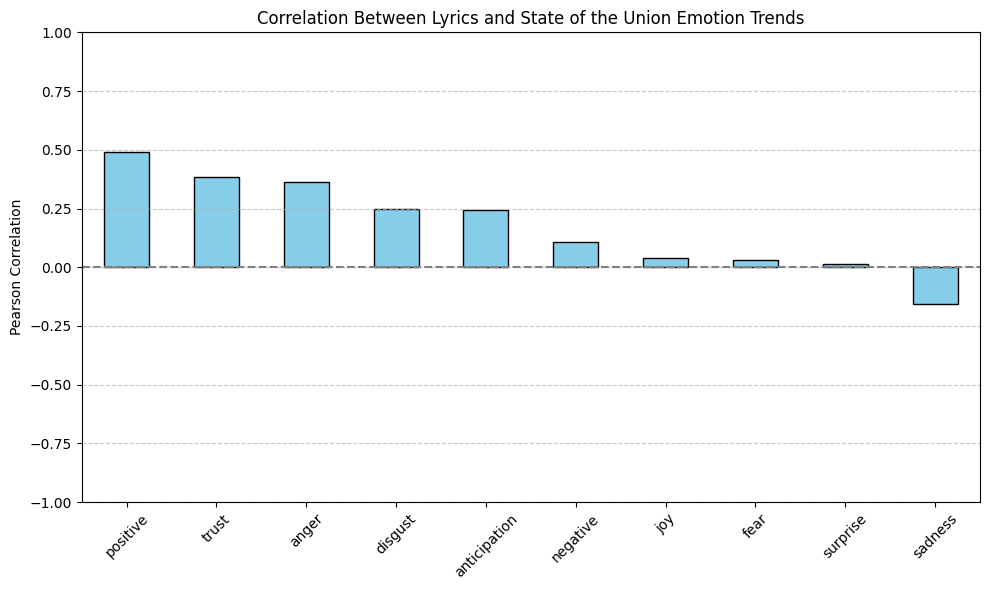

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
correlation_df['Correlation'].plot(kind='bar', color='skyblue', edgecolor='black')
plt.title("Correlation Between Lyrics and State of the Union Emotion Trends")
plt.ylabel("Pearson Correlation")
plt.ylim(-1, 1)
plt.axhline(0, color='gray', linestyle='--')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [ ]:
df

,Unnamed: 0,Title,Artist,Release Year,Genius_Link,Lyrics String,Emotion_Scores,Normalized_Emotion_Scores,Emotion_Percent_Scores,anger,disgust,fear,negative,sadness,positive,joy,trust,anticipation,surprise
0,0,Goodnight Irene,Gordon Jenkins & The Weavers,1950,https://genius.com/The-weavers-and-gordon-jenk...,Irene goodnight Irene goodnight Goodnight Iren...,"{'anger': 4, 'disgust': 4, 'fear': 5, 'negativ...","{'anger': 0.031007751937984496, 'disgust': 0.0...","{'anger': 3.10077519379845, 'disgust': 3.10077...",3.100775,3.100775,3.875969,4.651163,4.651163,1.550388,0.775194,0.000000,0.000000,0.000000
1,5,"Music, Music, Music",Teresa Brewer,1950,https://genius.com/Teresa-brewer-music-music-m...,Put another nickel in In the nickelodeon All I...,"{'joy': 29, 'positive': 31, 'sadness': 27, 'tr...","{'joy': 0.13744075829383887, 'positive': 0.146...","{'joy': 13.744075829383887, 'positive': 14.691...",0.000000,0.000000,0.000000,0.000000,12.796209,14.691943,13.744076,0.947867,0.000000,0.000000
2,7,Chattanoogie Shoe Shine Boy,Red Foley,1950,https://genius.com/Red-foley-chattanoogie-shoe...,Have you ever passed the corner of Forth and G...,"{'positive': 11, 'anticipation': 3, 'joy': 7, ...","{'positive': 0.04700854700854701, 'anticipatio...","{'positive': 4.700854700854701, 'anticipation'...",0.000000,0.000000,0.000000,0.854701,0.000000,4.700855,2.991453,1.282051,1.282051,0.854701
3,8,Harbor Lights,Sammy Kaye,1950,https://genius.com/Sammy-kaye-harbor-lights-ly...,I saw the harbor lights They only told me we w...,"{'trust': 6, 'sadness': 5, 'joy': 5, 'positive...","{'trust': 0.043478260869565216, 'sadness': 0.0...","{'trust': 4.3478260869565215, 'sadness': 3.623...",2.898551,1.449275,2.898551,2.898551,3.623188,4.347826,3.623188,4.347826,4.347826,1.449275
4,12,"Tzena, Tzena, Tzena",Gordon Jenkins & The Weavers,1950,https://genius.com/The-weavers-and-gordon-jenk...,Tzena Tzena Tzena Tzena Cant you hear the musi...,"{'joy': 13, 'positive': 15, 'sadness': 5, 'ant...","{'joy': 0.04318936877076412, 'positive': 0.049...","{'joy': 4.318936877076411, 'positive': 4.98338...",0.000000,0.000000,0.000000,0.000000,1.661130,4.983389,4.318937,2.657807,1.328904,1.328904
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6392,6926,Wind Up Missin' You,Tucker Wetmore,2024,https://genius.com/Tucker-wetmore-wind-up-miss...,I know I might look like Another ball cap on a...,"{'anticipation': 5, 'trust': 9, 'positive': 13...","{'anticipation': 0.01483679525222552, 'trust':...","{'anticipation': 1.483679525222552, 'trust': 2...",0.593472,0.593472,1.186944,2.077151,1.483680,3.857567,1.186944,2.670623,1.483680,0.890208
6393,6927,Bulletproof,Nate Smith,2024,https://genius.com/Nate-smith-bulletproof-lyrics,Usually these ol neon lights Are pretty good f...,"{'anticipation': 6, 'joy': 15, 'positive': 21,...","{'anticipation': 0.02027027027027027, 'joy': 0...","{'anticipation': 2.027027027027027, 'joy': 5.0...",0.675676,0.337838,2.364865,2.364865,1.689189,7.094595,5.067568,1.689189,2.027027,1.351351
6394,6929,The Painter,Cody Johnson,2024,https://genius.com/Cody-johnson-the-painter-ly...,She talks about the future like shes flippin t...,"{'joy': 9, 'positive': 11, 'anger': 3, 'fear':...","{'joy': 0.03435114503816794, 'positive': 0.041...","{'joy': 3.435114503816794, 'positive': 4.19847...",1.145038,0.000000,2.671756,1.908397,1.908397,4.198473,3.435115,1.908397,3.053435,0.763359
6395,6930,Down Bad,Taylor Swift,2024,https://genius.com/Taylor-swift-down-bad-lyrics,Did you really beam me up In a cloud of sparkl...,"{'joy': 6, 'positive': 19, 'negative': 28, 'an...","{'joy': 0.012711864406779662, 'positive': 0.04...","{'joy': 1.2711864406779663, 'positive': 4.0254...",3.601695,3.813559,4.237288,5.932203,5.084746,4.025424,1.271186,1.059322,1.271186,0.211864


### tfidf on lyric strings

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import make_pipeline
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import StandardScaler
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
df = pd.read_csv("https://raw.githubusercontent.com/anyabulchandani/DS112FinalProj/refs/heads/main/lyrics_with_emotion_scores")
df_filtered = df.dropna(subset=["Lyrics String"]).copy()
vec = CountVectorizer(max_features=10, stop_words="english")
X = vec.fit_transform(df_filtered["Lyrics String"])


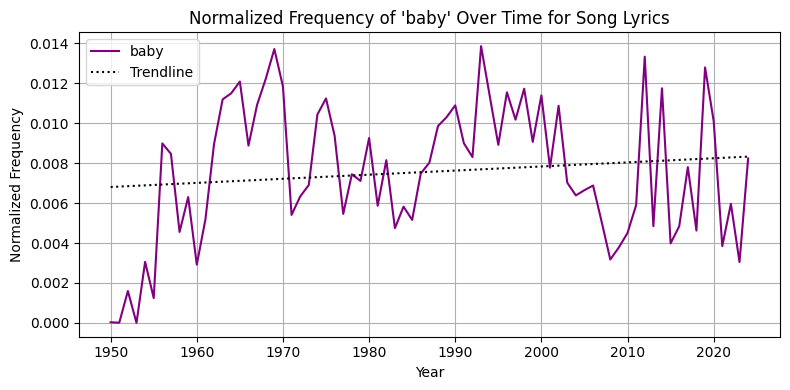

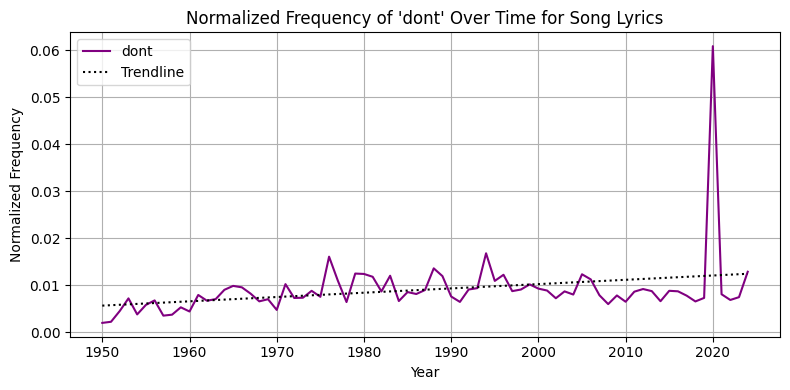

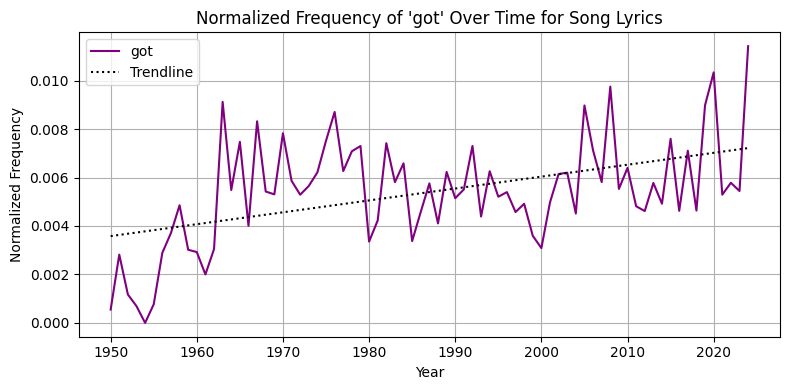

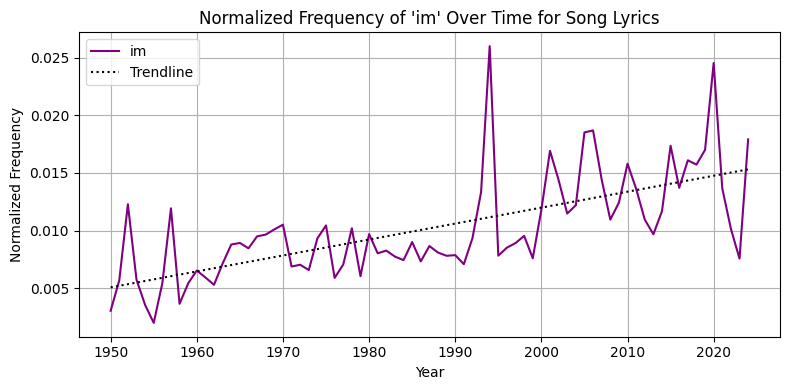

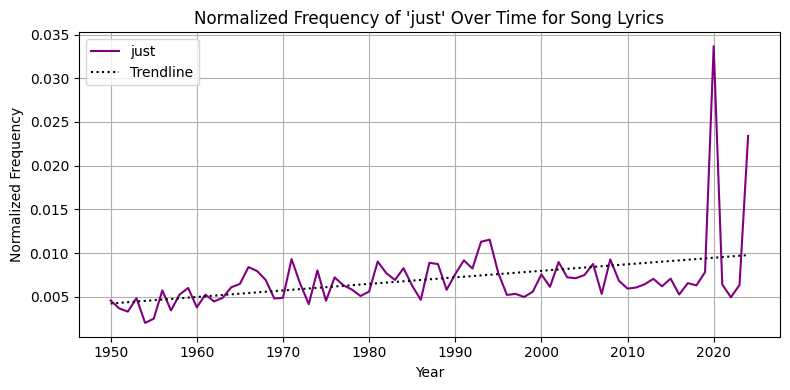

...

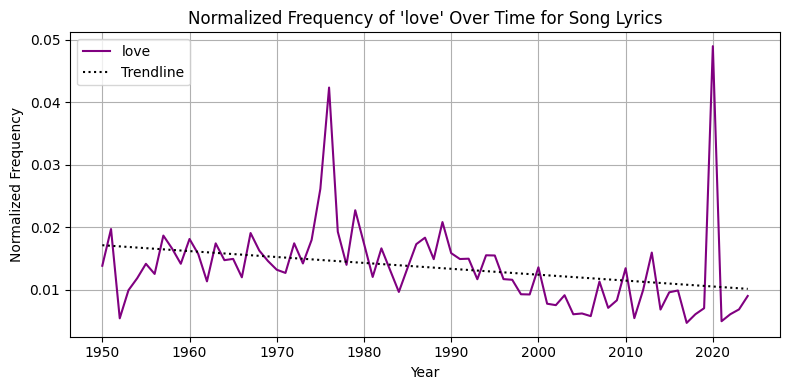

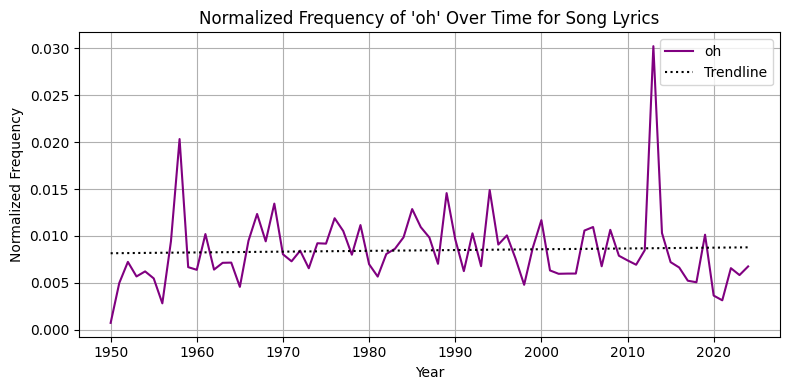

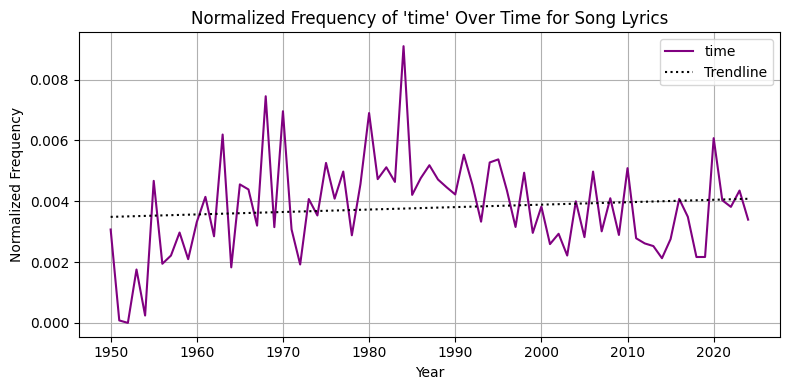

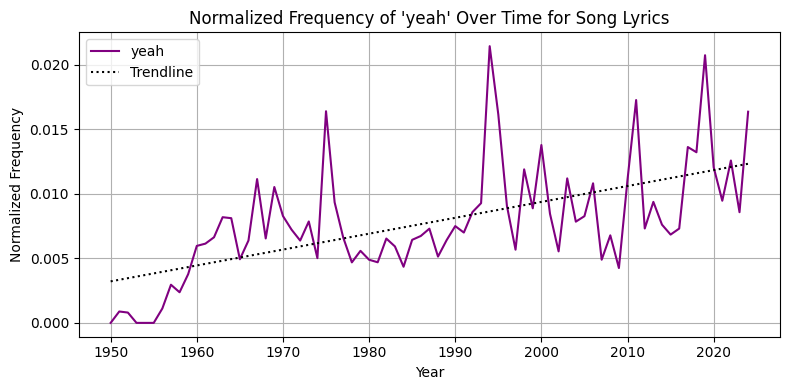

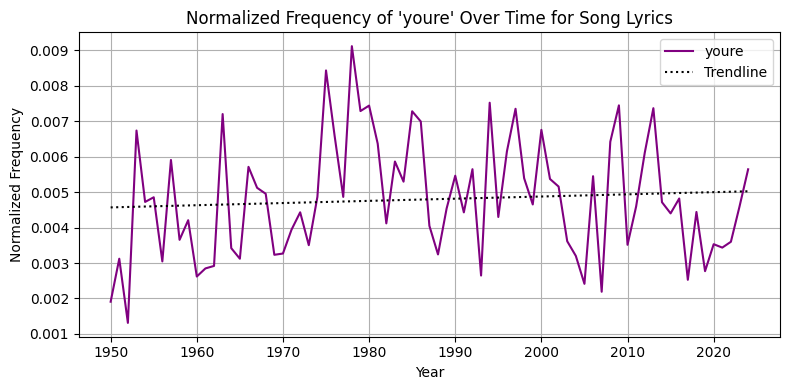

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer

# Load data
url = "https://raw.githubusercontent.com/anyabulchandani/DS112FinalProj/refs/heads/main/lyrics_with_emotion_scores"
df = pd.read_csv(url)

# Filter necessary columns
df_filtered = df.dropna(subset=["Lyrics String", "Release Year"]).copy()
df_filtered["Release Year"] = df_filtered["Release Year"].astype(int)

# Initialize CountVectorizer for 5 words only
vec = CountVectorizer(max_features=12, stop_words="english")
X = vec.fit_transform(df_filtered["Lyrics String"])

# Convert to DataFrame
word_counts = pd.DataFrame(X.toarray(), columns=vec.get_feature_names_out())

# Count total words per song for normalization
df_filtered["total_words"] = df_filtered["Lyrics String"].apply(lambda x: len(x.split()))
word_counts["total_words"] = df_filtered["total_words"]
word_counts["Year"] = df_filtered["Release Year"]

# Normalize word counts by total words
for word in vec.get_feature_names_out():
    word_counts[word] = word_counts[word] / word_counts["total_words"]

# Group by year and average
word_trends = word_counts.groupby("Year")[vec.get_feature_names_out()].mean()

# Plot each word separately with trendline
for word in word_trends.columns:
    plt.figure(figsize=(8, 4))

    # Actual values
    plt.plot(word_trends.index, word_trends[word], label=word, color='purple')

    # Trendline
    years = word_trends.index.values
    values = word_trends[word].values
    z = np.polyfit(years, values, 1)
    p = np.poly1d(z)
    plt.plot(years, p(years), linestyle='dotted', color='black', label='Trendline')

    plt.title(f"Normalized Frequency of '{word}' Over Time for Song Lyrics")
    plt.xlabel("Year")
    plt.ylabel("Normalized Frequency")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()



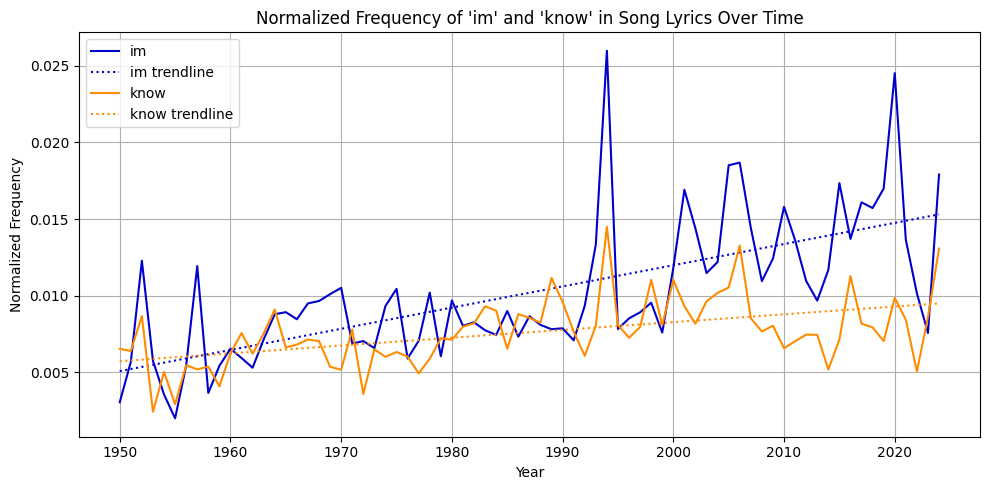

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer

# Load data
url = "https://raw.githubusercontent.com/anyabulchandani/DS112FinalProj/refs/heads/main/lyrics_with_emotion_scores"
df = pd.read_csv(url)

# Filter necessary columns
df_filtered = df.dropna(subset=["Lyrics String", "Release Year"]).copy()
df_filtered["Release Year"] = df_filtered["Release Year"].astype(int)

# Use a larger vocabulary to ensure "im" and "know" are included
vec = CountVectorizer(max_features=1000, stop_words="english")
X = vec.fit_transform(df_filtered["Lyrics String"])

# Convert to DataFrame
word_counts = pd.DataFrame(X.toarray(), columns=vec.get_feature_names_out())

# Count total words per song for normalization
df_filtered["total_words"] = df_filtered["Lyrics String"].apply(lambda x: len(x.split()))
word_counts["total_words"] = df_filtered["total_words"]
word_counts["Year"] = df_filtered["Release Year"]

# Normalize word counts by total words
for word in vec.get_feature_names_out():
    word_counts[word] = word_counts[word] / word_counts["total_words"]

# Group by year and average
word_trends = word_counts.groupby("Year")[vec.get_feature_names_out()].mean()

# Plot both "im" and "know" on one plot with trendlines
words_to_plot = ["im", "know"]
colors = {"im": "mediumblue", "know": "darkorange"}

plt.figure(figsize=(10, 5))

for word in words_to_plot:
    if word in word_trends.columns:
        # Plot actual frequency
        plt.plot(word_trends.index, word_trends[word], label=word, color=colors[word])

        # Trendline
        years = word_trends.index.values
        values = word_trends[word].values
        z = np.polyfit(years, values, 1)
        p = np.poly1d(z)
        plt.plot(years, p(years), linestyle='dotted', color=colors[word], label=f"{word} trendline")

plt.title("Normalized Frequency of 'im' and 'know' in Song Lyrics Over Time")
plt.xlabel("Year")
plt.ylabel("Normalized Frequency")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
df = pd.read_csv("https://raw.githubusercontent.com/anyabulchandani/DS112FinalProj/refs/heads/main/lyrics_with_emotion_scores")
df_filtered = df.dropna(subset=["Lyrics String"]).copy()
tfidf = TfidfVectorizer(smooth_idf=False, norm=None, max_features=1000, stop_words="english")
X_tfidf = tfidf.fit_transform(df_filtered["Lyrics String"])
model = KMeans(n_clusters=3, random_state=42, n_init=10)
df_filtered["cluster"] = model.fit_predict(X_tfidf)
df_filtered
### do we want to fit the model on tfidf as well as release year data?



,Unnamed: 0,Title,Artist,Release Year,Genius_Link,Lyrics String,Emotion_Scores,Normalized_Emotion_Scores,Emotion_Percent_Scores,anger,...,fear,negative,sadness,positive,joy,trust,anticipation,surprise,cluster,decade
0,0,Goodnight Irene,Gordon Jenkins & The Weavers,1950,https://genius.com/The-weavers-and-gordon-jenk...,Irene goodnight Irene goodnight Goodnight Iren...,"{'anger': 4, 'disgust': 4, 'fear': 5, 'negativ...","{'anger': 0.031007751937984496, 'disgust': 0.0...","{'anger': 3.10077519379845, 'disgust': 3.10077...",3.100775,...,3.875969,4.651163,4.651163,1.550388,0.775194,0.000000,0.000000,0.000000,0,1950
1,5,"Music, Music, Music",Teresa Brewer,1950,https://genius.com/Teresa-brewer-music-music-m...,Put another nickel in In the nickelodeon All I...,"{'joy': 29, 'positive': 31, 'sadness': 27, 'tr...","{'joy': 0.13744075829383887, 'positive': 0.146...","{'joy': 13.744075829383887, 'positive': 14.691...",0.000000,...,0.000000,0.000000,12.796209,14.691943,13.744076,0.947867,0.000000,0.000000,0,1950
2,7,Chattanoogie Shoe Shine Boy,Red Foley,1950,https://genius.com/Red-foley-chattanoogie-shoe...,Have you ever passed the corner of Forth and G...,"{'positive': 11, 'anticipation': 3, 'joy': 7, ...","{'positive': 0.04700854700854701, 'anticipatio...","{'positive': 4.700854700854701, 'anticipation'...",0.000000,...,0.000000,0.854701,0.000000,4.700855,2.991453,1.282051,1.282051,0.854701,0,1950
3,8,Harbor Lights,Sammy Kaye,1950,https://genius.com/Sammy-kaye-harbor-lights-ly...,I saw the harbor lights They only told me we w...,"{'trust': 6, 'sadness': 5, 'joy': 5, 'positive...","{'trust': 0.043478260869565216, 'sadness': 0.0...","{'trust': 4.3478260869565215, 'sadness': 3.623...",2.898551,...,2.898551,2.898551,3.623188,4.347826,3.623188,4.347826,4.347826,1.449275,0,1950
4,12,"Tzena, Tzena, Tzena",Gordon Jenkins & The Weavers,1950,https://genius.com/The-weavers-and-gordon-jenk...,Tzena Tzena Tzena Tzena Cant you hear the musi...,"{'joy': 13, 'positive': 15, 'sadness': 5, 'ant...","{'joy': 0.04318936877076412, 'positive': 0.049...","{'joy': 4.318936877076411, 'positive': 4.98338...",0.000000,...,0.000000,0.000000,1.661130,4.983389,4.318937,2.657807,1.328904,1.328904,0,1950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6392,6926,Wind Up Missin' You,Tucker Wetmore,2024,https://genius.com/Tucker-wetmore-wind-up-miss...,I know I might look like Another ball cap on a...,"{'anticipation': 5, 'trust': 9, 'positive': 13...","{'anticipation': 0.01483679525222552, 'trust':...","{'anticipation': 1.483679525222552, 'trust': 2...",0.593472,...,1.186944,2.077151,1.483680,3.857567,1.186944,2.670623,1.483680,0.890208,0,2020
6393,6927,Bulletproof,Nate Smith,2024,https://genius.com/Nate-smith-bulletproof-lyrics,Usually these ol neon lights Are pretty good f...,"{'anticipation': 6, 'joy': 15, 'positive': 21,...","{'anticipation': 0.02027027027027027, 'joy': 0...","{'anticipation': 2.027027027027027, 'joy': 5.0...",0.675676,...,2.364865,2.364865,1.689189,7.094595,5.067568,1.689189,2.027027,1.351351,0,2020
6394,6929,The Painter,Cody Johnson,2024,https://genius.com/Cody-johnson-the-painter-ly...,She talks about the future like shes flippin t...,"{'joy': 9, 'positive': 11, 'anger': 3, 'fear':...","{'joy': 0.03435114503816794, 'positive': 0.041...","{'joy': 3.435114503816794, 'positive': 4.19847...",1.145038,...,2.671756,1.908397,1.908397,4.198473,3.435115,1.908397,3.053435,0.763359,0,2020
6395,6930,Down Bad,Taylor Swift,2024,https://genius.com/Taylor-swift-down-bad-lyrics,Did you really beam me up In a cloud of sparkl...,"{'joy': 6, 'positive': 19, 'negative': 28, 'an...","{'joy': 0.012711864406779662, 'positive': 0.04...","{'joy': 1.2711864406779663, 'positive': 4.0254...",3.601695,...,4.237288,5.932203,5.084746,4.025424,1.271186,1.059322,1.271186,0.211864,0,2020


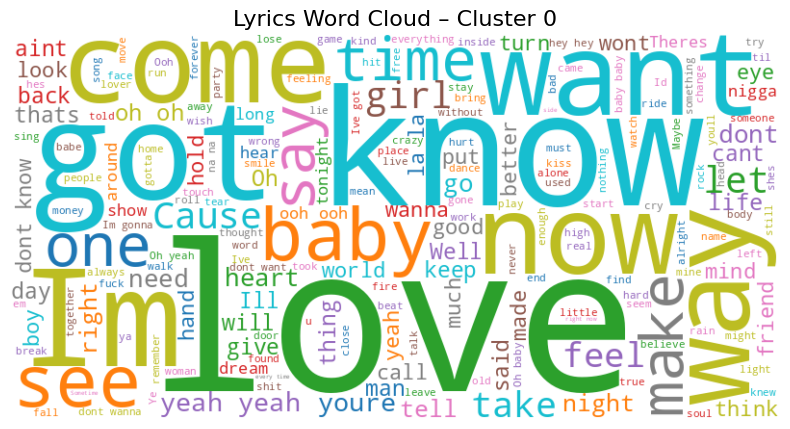

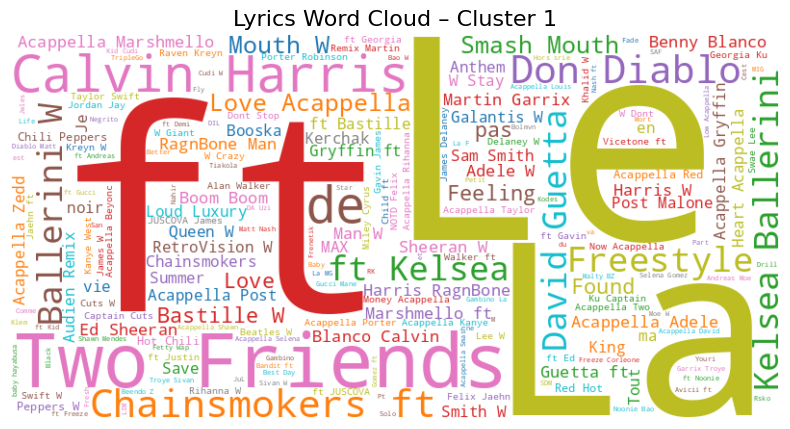

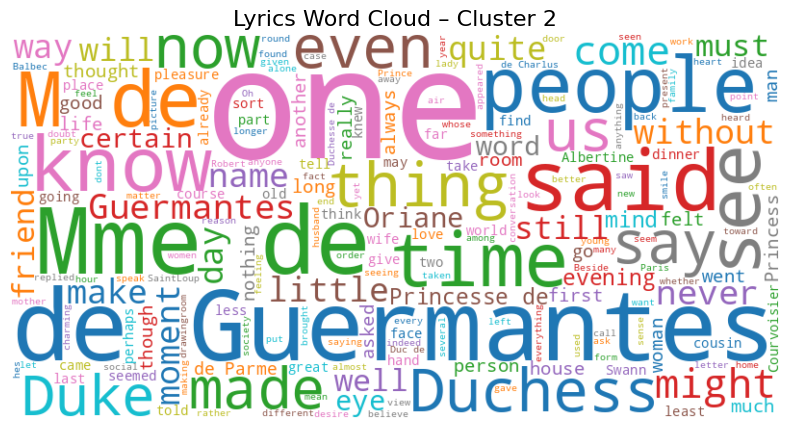

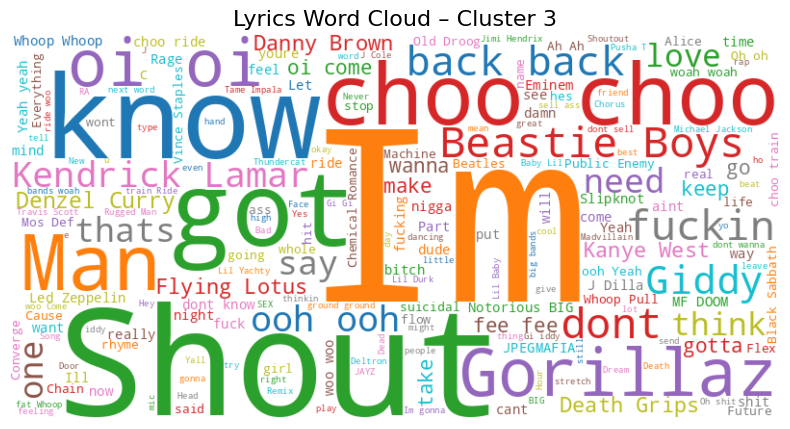

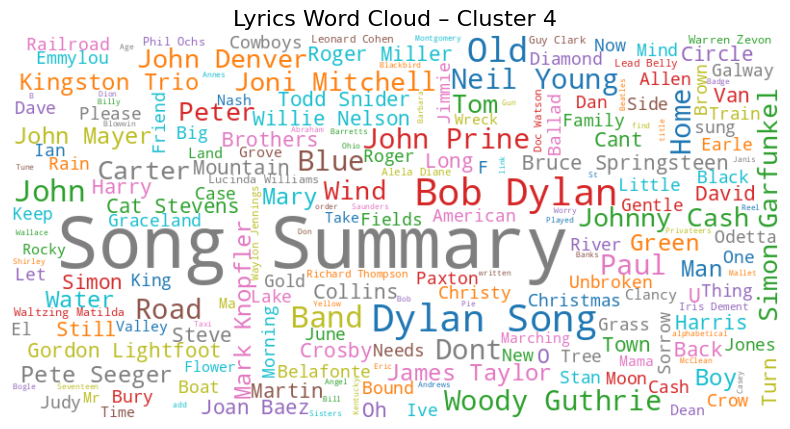

In [ ]:
for cluster_num in sorted(df_filtered["cluster"].unique()):
    # Get all lyrics for this cluster
    cluster_lyrics = df_filtered[df_filtered["cluster"] == cluster_num]["Lyrics String"].str.cat(sep=" ")

    # Create the word cloud
    wc = WordCloud(width=800, height=400, background_color='white', colormap='tab10').generate(cluster_lyrics)

    # Plot it
    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Lyrics Word Cloud – Cluster {cluster_num}", fontsize=16)
    plt.show()


In [ ]:
emotion_cols = [
    "anger", "disgust", "fear", "negative", "sadness",
    "positive", "joy", "trust", "anticipation", "surprise"
]
cluster_means = df_filtered.groupby("cluster")[emotion_cols].mean()
cluster_means

,anger,disgust,fear,negative,sadness,positive,joy,trust,anticipation,surprise
cluster,,,,,,,,,,
0,1.719622,1.193042,1.867066,3.226384,2.084675,5.454823,4.045291,2.414710,2.612973,1.444404
1,1.080932,0.763822,1.354842,2.748288,1.286824,5.119721,1.924721,2.639827,2.023071,1.001884
2,2.238233,1.078643,2.335564,3.175620,1.521954,5.413336,3.577424,3.258695,2.095138,1.369604


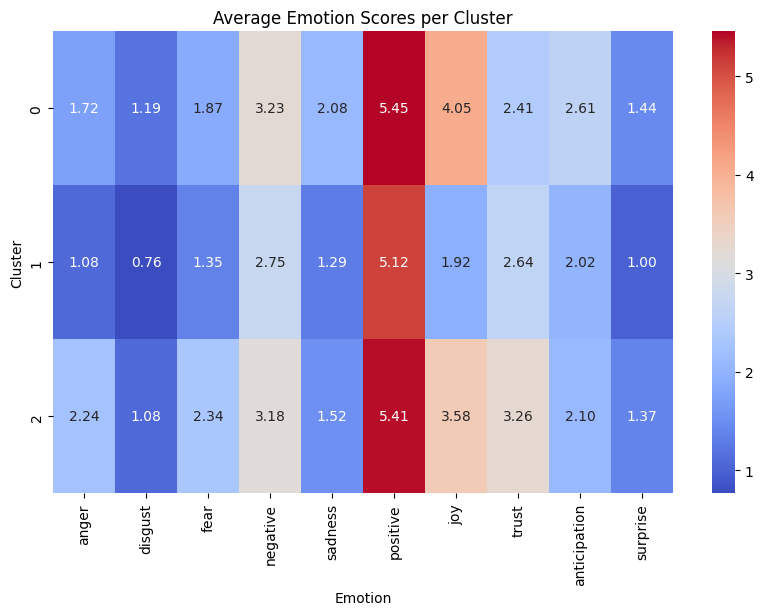

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.heatmap(cluster_means, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Average Emotion Scores per Cluster")
plt.xlabel("Emotion")
plt.ylabel("Cluster")
plt.show()

In [ ]:
df_filtered.groupby("cluster")["Release Year"].mean()

,Release Year
cluster,
0,1989.594014
1,1953.000000
2,2005.444444


<ipython-input-12-cfcf66dceb61>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Year', y='cluster', data=df, size=10, palette='Set2', orient='h')


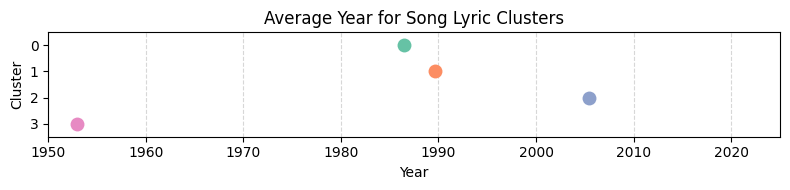

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define the data
data = {
    'cluster': [0, 1, 2, 3],
    'Year': [1986.50000, 1989.59498, 2005.44444, 1953.00000]
}
df = pd.DataFrame(data)

# Plot
plt.figure(figsize=(8, 2))
sns.stripplot(x='Year', y='cluster', data=df, size=10, palette='Set2', orient='h')
plt.title("Average Year for Song Lyric Clusters")
plt.xlim(1950, 2025)
plt.xlabel("Year")
plt.ylabel("Cluster")
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

so, our clusters are largely demarcated by time period. but cluster 0 and 1 are really close. but looking at the average emotion scores, cluster 0 is sad music around the 80's, and cluster 1 is happy music around the 80s. from this we can see that there is a lot of variation of positivity in songs in the 80s. lets look at SoU speaches to perhaps understand why that may be

it looks like when we cluster by tfidf, we get a demarcation of genre / time. lets see what happens when we cluster the SOU with tdf

### tfidf on SOU addresses

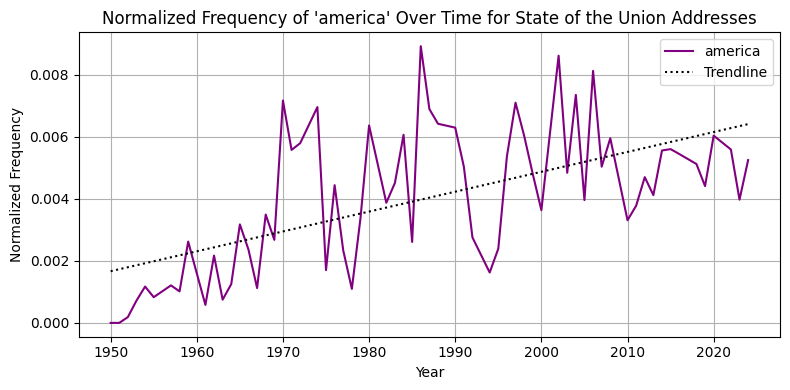

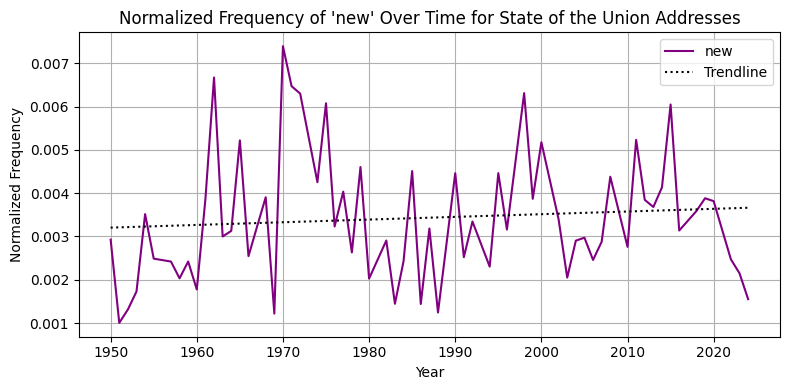

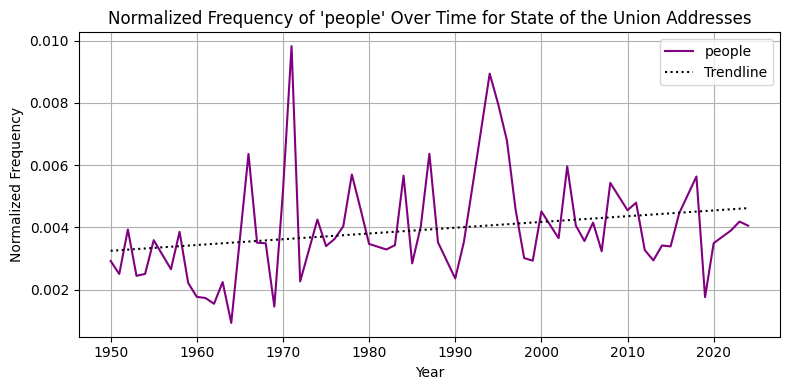

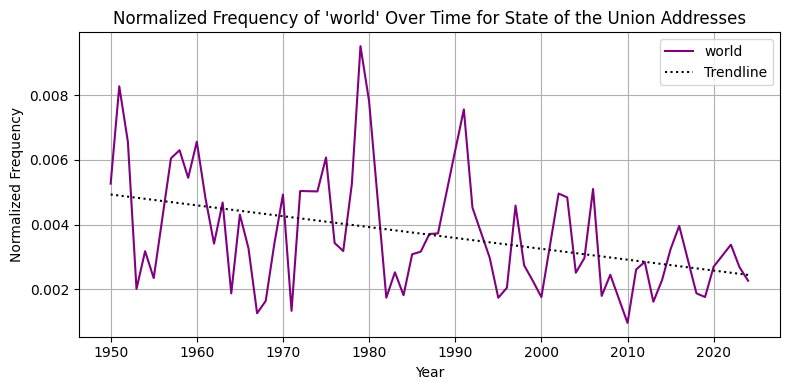

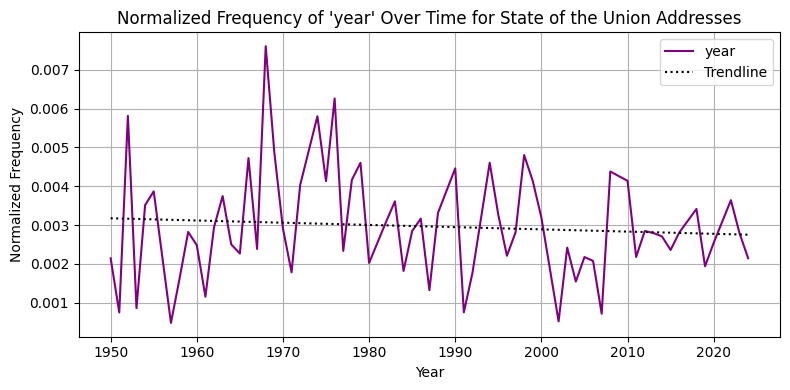

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer

# Load data
url = "https://raw.githubusercontent.com/anyabulchandani/DS112FinalProj/refs/heads/main/State_of_the_Union_1950_to_2024.csv"
df = pd.read_csv(url)

# Filter necessary columns
df_filtered = df.dropna(subset=["Text", "Year"]).copy()

# Initialize CountVectorizer for 5 words only
vec = CountVectorizer(max_features=5, stop_words="english")
X = vec.fit_transform(df_filtered["Text"])

# Convert to DataFrame
word_counts = pd.DataFrame(X.toarray(), columns=vec.get_feature_names_out())

# Count total words for normalization
df_filtered["total_words"] = df_filtered["Text"].apply(lambda x: len(x.split()))
word_counts["total_words"] = df_filtered["total_words"]
word_counts["Year"] = df_filtered["Year"]

# Normalize word counts by total words
for word in vec.get_feature_names_out():
    word_counts[word] = word_counts[word] / word_counts["total_words"]

# Group by year and average
word_trends = word_counts.groupby("Year")[vec.get_feature_names_out()].mean()

# Plot each word with trendline
for word in word_trends.columns:
    plt.figure(figsize=(8, 4))

    # Plot actual normalized frequency
    plt.plot(word_trends.index, word_trends[word], label=word, color='purple')

    # Trendline (linear)
    years = word_trends.index.values
    values = word_trends[word].values
    z = np.polyfit(years, values, 1)        # Linear regression
    p = np.poly1d(z)
    plt.plot(years, p(years), linestyle='dotted', color='black', label='Trendline')

    plt.title(f"Normalized Frequency of '{word}' Over Time for State of the Union Addresses")
    plt.xlabel("Year")
    plt.ylabel("Normalized Frequency")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


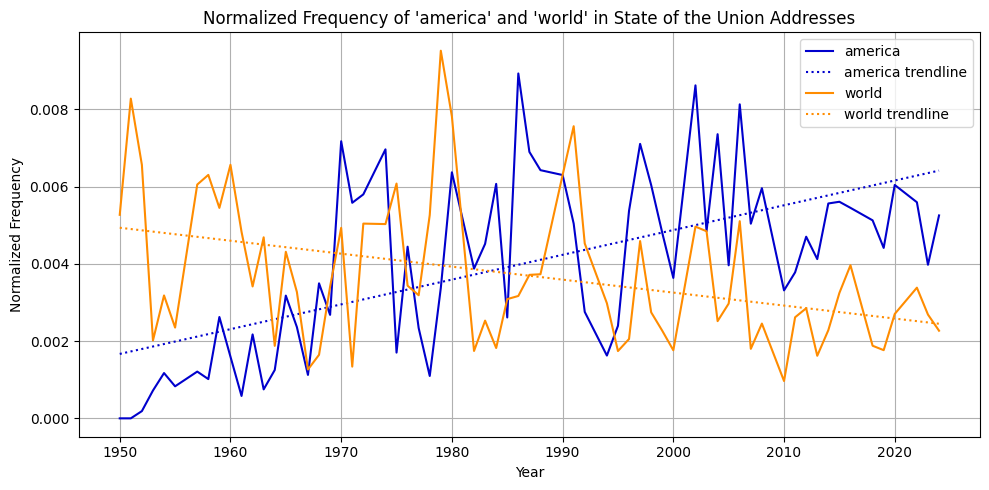

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer

# Load data
url = "https://raw.githubusercontent.com/anyabulchandani/DS112FinalProj/refs/heads/main/State_of_the_Union_1950_to_2024.csv"
df = pd.read_csv(url)

# Filter necessary columns
df_filtered = df.dropna(subset=["Text", "Year"]).copy()
df_filtered["Year"] = df_filtered["Year"].astype(int)

# Use a larger vocabulary to make sure 'america' and 'world' are included
vec = CountVectorizer(max_features=1000, stop_words="english")
X = vec.fit_transform(df_filtered["Text"])

# Convert to DataFrame
word_counts = pd.DataFrame(X.toarray(), columns=vec.get_feature_names_out())

# Count total words per document
df_filtered["total_words"] = df_filtered["Text"].apply(lambda x: len(x.split()))
word_counts["total_words"] = df_filtered["total_words"]
word_counts["Year"] = df_filtered["Year"]

# Normalize word counts
for word in vec.get_feature_names_out():
    word_counts[word] = word_counts[word] / word_counts["total_words"]

# Group by year and average
word_trends = word_counts.groupby("Year")[vec.get_feature_names_out()].mean()

# Plot 'america' and 'world' on same plot with trendlines
words_to_plot = ["america", "world"]
colors = {"america": "mediumblue", "world": "darkorange"}

plt.figure(figsize=(10, 5))

for word in words_to_plot:
    if word in word_trends.columns:
        # Plot frequency
        plt.plot(word_trends.index, word_trends[word], label=word, color=colors[word])

        # Linear trendline
        years = word_trends.index.values
        values = word_trends[word].values
        z = np.polyfit(years, values, 1)
        p = np.poly1d(z)
        plt.plot(years, p(years), linestyle='dotted', color=colors[word], label=f"{word} trendline")

plt.title("Normalized Frequency of 'america' and 'world' in State of the Union Addresses")
plt.xlabel("Year")
plt.ylabel("Normalized Frequency")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


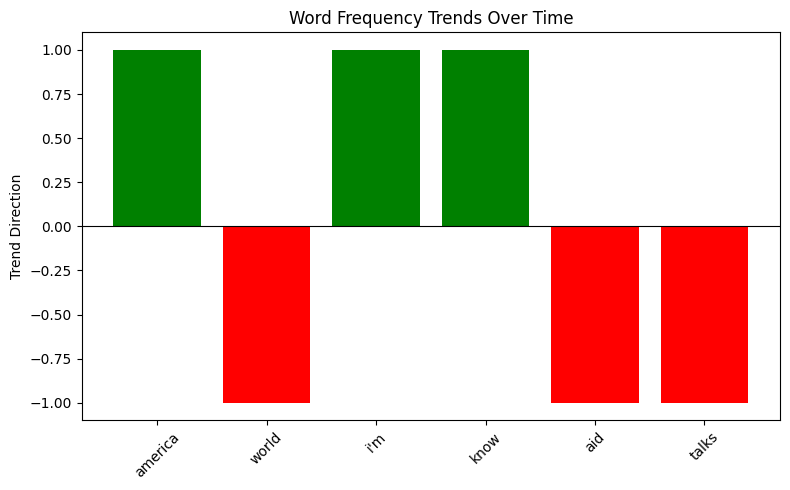

In [ ]:
import matplotlib.pyplot as plt

words = ['america', 'world', 'i\'m', 'know', 'aid', 'talks']
trends = [1, -1, 1, 1, -1, -1]  # estimated trend directions
colors = ['green' if t > 0 else 'red' if t < 0 else 'gray' for t in trends]

plt.figure(figsize=(8, 5))
plt.bar(words, trends, color=colors)
plt.axhline(0, color='black', linewidth=0.8)
plt.ylabel('Trend Direction')
plt.title('Word Frequency Trends Over Time')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
url = "NYT_headlines_1950_to_2024"

subset = ["Headlines", "Year"].copy

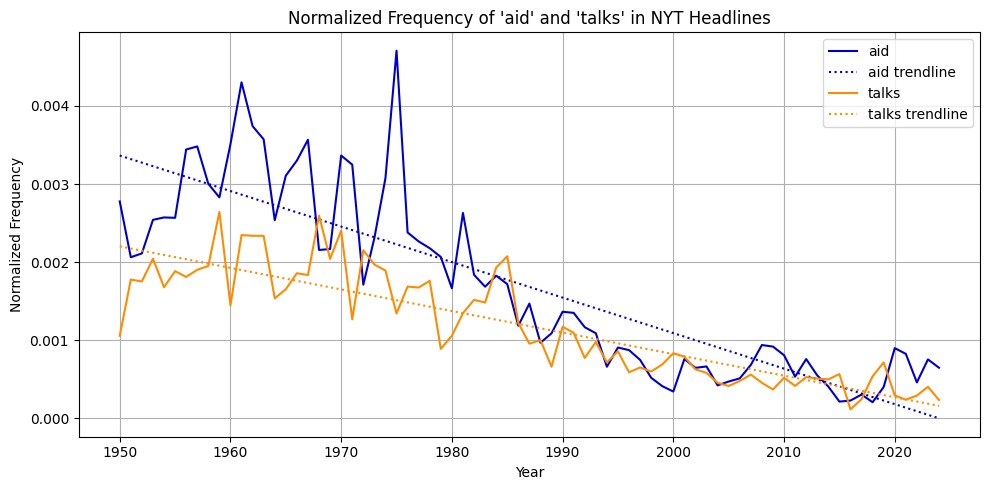

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer

# Load data
url = "https://raw.githubusercontent.com/anyabulchandani/DS112FinalProj/refs/heads/main/NYT_headlines_1950_to_2024.csv"
df = pd.read_csv(url)

# Filter necessary columns
df_filtered = df.dropna(subset=["Headlines", "Year"]).copy()
df_filtered["Year"] = df_filtered["Year"].astype(int)

# Use a larger vocabulary to make sure 'america' and 'world' are included
vec = CountVectorizer(max_features=1000, stop_words="english")
X = vec.fit_transform(df_filtered["Headlines"])

# Convert to DataFrame
word_counts = pd.DataFrame(X.toarray(), columns=vec.get_feature_names_out())

# Count total words per document
df_filtered["total_words"] = df_filtered["Headlines"].apply(lambda x: len(x.split()))
word_counts["total_words"] = df_filtered["total_words"]
word_counts["Year"] = df_filtered["Year"]

# Normalize word counts
for word in vec.get_feature_names_out():
    word_counts[word] = word_counts[word] / word_counts["total_words"]

# Group by year and average
word_trends = word_counts.groupby("Year")[vec.get_feature_names_out()].mean()

# Plot 'america' and 'world' on same plot with trendlines
words_to_plot = ["aid", "talks"]
colors = {"aid": "mediumblue", "talks": "darkorange"}

plt.figure(figsize=(10, 5))

for word in words_to_plot:
    if word in word_trends.columns:
        # Plot frequency
        plt.plot(word_trends.index, word_trends[word], label=word, color=colors[word])

        # Linear trendline
        years = word_trends.index.values
        values = word_trends[word].values
        z = np.polyfit(years, values, 1)
        p = np.poly1d(z)
        plt.plot(years, p(years), linestyle='dotted', color=colors[word], label=f"{word} trendline")

plt.title("Normalized Frequency of 'aid' and 'talks' in NYT Headlines")
plt.xlabel("Year")
plt.ylabel("Normalized Frequency")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
df_filtered_sou = df_sou.dropna(subset=["Text"]).copy()
tfidf = TfidfVectorizer(smooth_idf=False, norm=None, max_features=1000, stop_words="english")
X_tfidf = tfidf.fit_transform(df_filtered_sou["Text"])
model = KMeans(n_clusters=k, random_state=42, n_init=10)
df_filtered_sou["cluster"] = model.fit_predict(X_tfidf)
df_filtered_sou

,Year,Link,Text,cluster
0,2024,/documents/address-before-joint-session-the-co...,"[ Before speaking, the President presented his...",2
1,2024,/documents/address-before-joint-session-the-co...,"[ Before speaking, the President presented his...",2
2,2023,/documents/address-before-joint-session-the-co...,"The President. Mr. Speaker—— [ At this point, ...",2
3,2022,/documents/address-before-joint-session-the-co...,"The President. Thank you all very, very much. ...",3
4,2020,/documents/address-before-joint-session-the-co...,The President. Thank you very much. Thank you....,1
...,...,...,...,...
62,1954,/documents/annual-message-the-congress-the-sta...,"Mr. President, Mr. Speaker, Members of the Eig...",0
63,1953,/documents/annual-message-the-congress-the-sta...,"Mr. President, Mr. Speaker, Members of the Eig...",0
64,1952,/documents/annual-message-the-congress-the-sta...,"Mr. President, Mr. Speaker, Members of the Con...",0
65,1951,/documents/annual-message-the-congress-the-sta...,"Mr. President, Mr. Speaker, Members of the Con...",0


In [ ]:
df_filtered_sou["Year"] = df_filtered_sou["Year"].astype(int)
mean_years = df_filtered_sou.groupby("cluster")["Year"].mean()
mean_years
# so the addresses clustered by year. interesting but not that interesting. this means that the words are directly linked to the years. how can we see how this relates to songs?

,Year
cluster,
0,1956.538462
1,1986.416667
2,2023.666667
3,2006.133333


<ipython-input-11-5c76e68354d7>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Year', y='cluster', data=df, size=10, palette='Set2', orient='h')


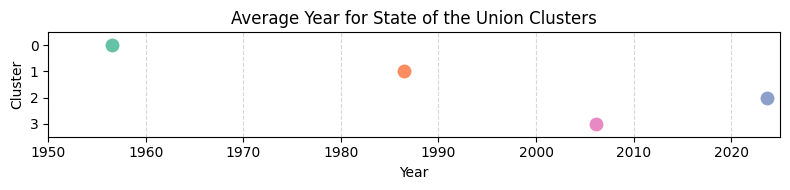

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define the data
data = {
    'cluster': [0, 1, 2, 3],
    'Year': [1956.53846, 1986.41666, 2023.66666, 2006.13333]
}
df = pd.DataFrame(data)

# Plot
plt.figure(figsize=(8, 2))
sns.stripplot(x='Year', y='cluster', data=df, size=10, palette='Set2', orient='h')
plt.title("Average Year for State of the Union Clusters")
plt.xlim(1950, 2025)
plt.xlabel("Year")
plt.ylabel("Cluster")
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

the SoU speaches clustered by year, looking at the data we see that the emotion scores and word clouds we see that the word "will" is not as present in the most recent cluster, as though closer to the modern day, american politics are not as future facing

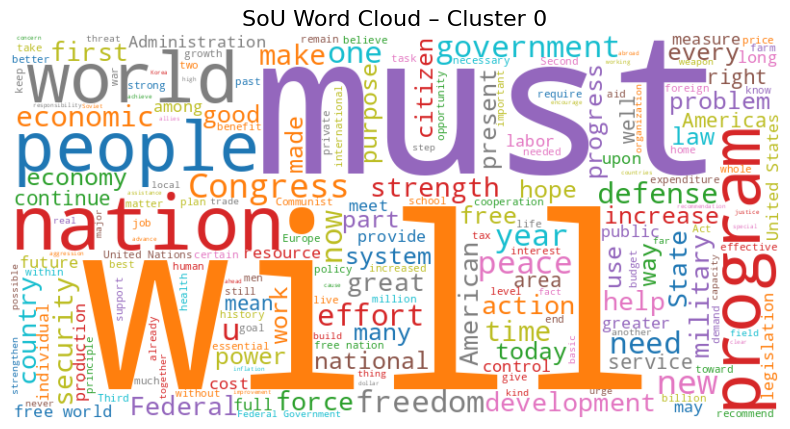

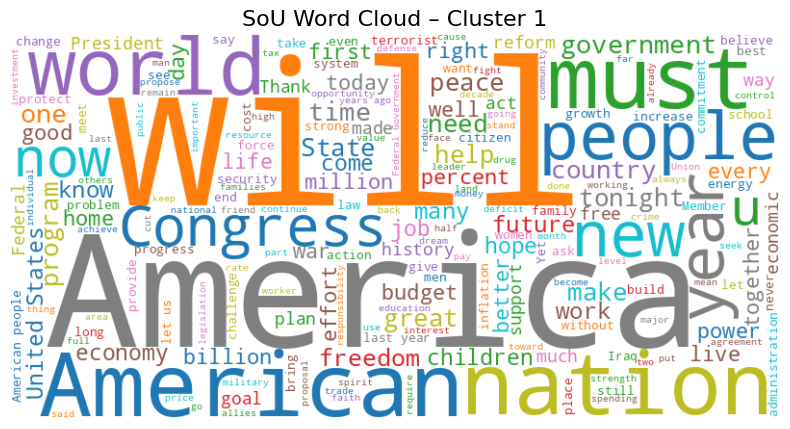

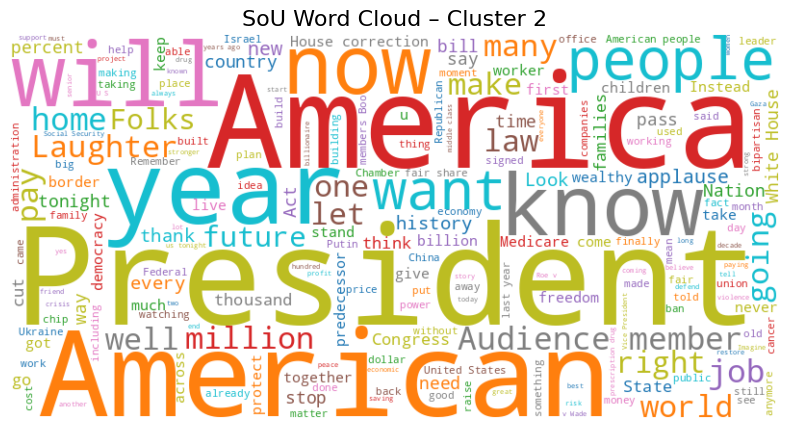

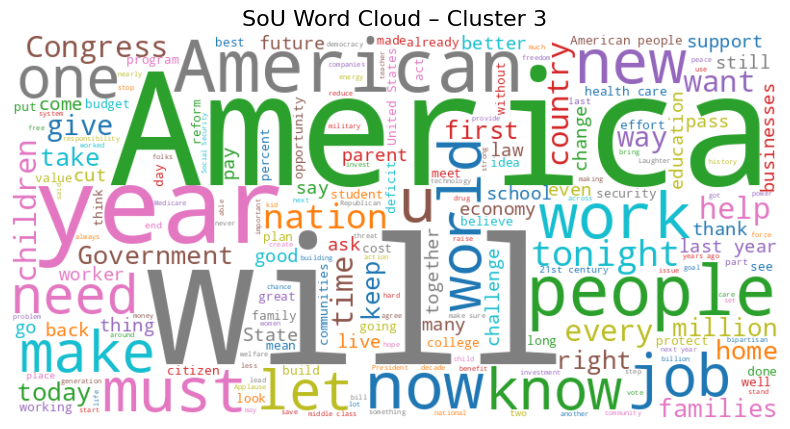

In [ ]:
for cluster_num in sorted(df_filtered["cluster"].unique()):
    # Get all lyrics for this cluster
    cluster_lyrics = df_filtered[df_filtered["cluster"] == cluster_num]["Text"].str.cat(sep=" ")

    # Create the word cloud
    wc = WordCloud(width=800, height=400, background_color='white', colormap='tab10').generate(cluster_lyrics)

    # Plot it
    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"SoU Word Cloud – Cluster {cluster_num}", fontsize=16)
    plt.show()

In [ ]:
sou_emotions = pd.read_csv("https://raw.githubusercontent.com/anyabulchandani/DS112FinalProj/refs/heads/main/sentiment_by_year_lyrics_and_SOU.csv")
sou_emotions

,Unnamed: 0,Year,anger_lyrics,disgust_lyrics,fear_lyrics,negative_lyrics,sadness_lyrics,positive_lyrics,joy_lyrics,trust_lyrics,...,positive_stateofunion,trust_stateofunion,anticipation_stateofunion,joy_stateofunion,surprise_stateofunion,negative_stateofunion,disgust_stateofunion,fear_stateofunion,anger_stateofunion,sadness_stateofunion
0,0,1950,0.806113,0.739271,1.803542,2.907021,2.920556,8.324095,5.834628,3.261403,...,10.168507,6.682162,3.621925,3.350765,1.123378,2.614759,0.852218,2.169281,0.987798,1.239589
1,1,1951,1.966727,1.291338,1.629808,2.514249,3.092787,7.470992,4.937109,2.612074,...,8.381000,4.824670,3.158418,2.287988,1.069386,3.581199,0.770952,3.780154,2.835116,1.168863
2,2,1952,2.304667,1.805755,2.349911,6.557106,4.316023,6.035773,4.345307,2.932387,...,8.756016,5.164754,3.646797,2.536098,1.147723,3.683821,1.036653,3.461681,2.369493,1.166235
3,3,1953,1.700255,1.741676,1.776985,3.094340,2.574193,5.619311,3.823855,3.388439,...,9.054613,7.044061,3.108513,2.409810,1.069442,3.593327,0.655925,2.694995,1.440183,1.140739
4,4,1954,1.466768,0.851022,2.349732,3.177640,2.564355,5.312747,4.152410,2.543146,...,9.622050,6.667767,3.680475,2.541674,0.990262,3.614458,0.709688,2.871761,1.419376,1.303846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,61,2019,2.564038,1.713080,2.226504,4.143834,2.267413,3.758434,2.436875,1.814137,...,7.167590,4.830332,3.393352,3.133657,1.696676,4.120499,1.904432,2.977839,2.614266,2.389197
62,62,2020,2.390605,1.617771,2.694218,4.315581,2.248405,4.399697,3.030979,2.084571,...,7.120791,5.143652,3.181959,2.903923,1.343837,3.444547,1.482854,2.795799,1.915354,1.745443
63,63,2022,1.734350,1.213703,1.576158,3.394507,1.904404,3.727824,2.475703,1.775728,...,6.314623,4.468242,2.831118,1.957164,0.972427,3.286558,0.837026,2.117184,1.489414,1.550960
64,64,2023,2.013143,1.615778,1.800215,3.430791,1.862842,3.936289,2.698835,2.152398,...,5.920114,4.177705,2.700224,2.200937,1.080090,3.321785,0.855920,2.078663,1.416344,1.497860


In [ ]:
emotion_cols = ["positive_stateofunion",	"trust_stateofunion",	"anticipation_stateofunion",	"joy_stateofunion",	"surprise_stateofunion",	"negative_stateofunion",	"disgust_stateofunion",	"fear_stateofunion",	"anger_stateofunion",	"sadness_stateofunion"]
merged = pd.merge(
    sou_emotions[emotion_cols],
    df_filtered_sou["cluster"],
    left_index=True,
    right_index=True,
    how='inner'  # or 'outer', 'left', 'right'
)
mean_sou_emotions = merged.groupby("cluster")[emotion_cols].mean()
mean_sou_emotions

,positive_stateofunion,trust_stateofunion,anticipation_stateofunion,joy_stateofunion,surprise_stateofunion,negative_stateofunion,disgust_stateofunion,fear_stateofunion,anger_stateofunion,sadness_stateofunion
cluster,,,,,,,,,,
0,6.480477,4.437060,2.819442,2.332825,1.171677,3.188983,0.976762,2.133556,1.527210,1.529847
1,7.593411,5.425104,3.156045,2.588892,1.064938,3.533776,0.995240,2.571015,1.569240,1.413911
2,9.101841,5.557195,3.475714,2.724950,1.113496,3.293259,0.886608,3.137039,2.064135,1.191563
3,8.521506,5.883782,3.261357,2.557097,0.966329,3.452834,0.948265,2.532102,1.413735,1.324645


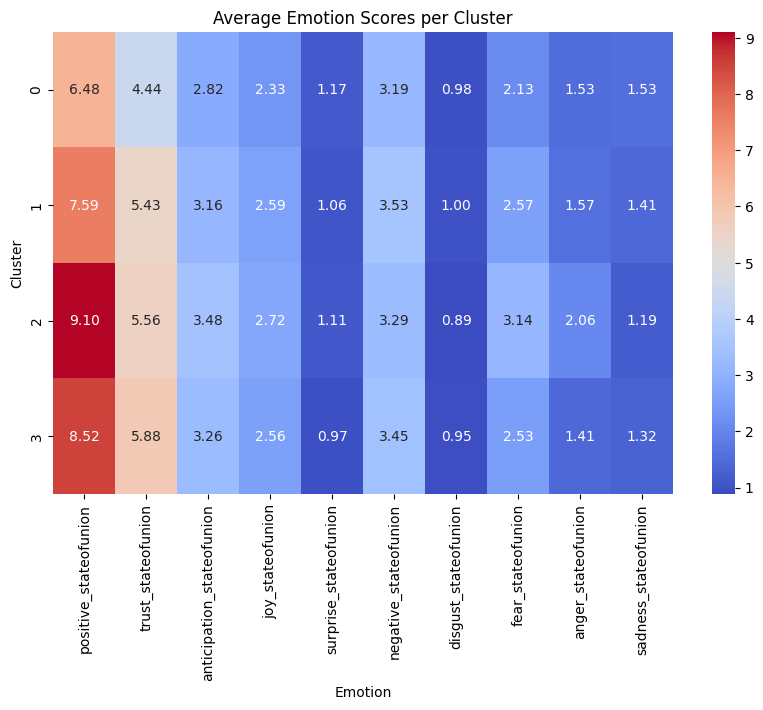

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.heatmap(mean_sou_emotions, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Average Emotion Scores per Cluster")
plt.xlabel("Emotion")
plt.ylabel("Cluster")
plt.show()

### NYT API

#### Keys and stuff:

key: "hxNz718lLTAvGAaYf3uNkhNbm5U6jDD8"
secret: "mGmhlq7KavoYD3Gx"

In [ ]:
import requests
import time

API_KEY = "hxNz718lLTAvGAaYf3uNkhNbm5U6jDD8"
BASE_URL = 'https://api.nytimes.com/svc/archive/v1/{}/{}.json'

def fetch_articles(year, month):
    url = BASE_URL.format(year, month)
    params = {'api-key': API_KEY}
    response = requests.get(url, params=params)
    if response.status_code == 200:
        return response.json()['response']['docs']
    else:
        print(f"Failed for {year}-{month}: {response.status_code}")
        return []

def get_headlines_for_year(year):
    headlines = []
    for month in range(1, 13):
        articles = fetch_articles(year, month)
        for article in articles:
            if (
                # article.get('type_of_material') == 'News' and
                article.get('print_page') == '1' and
                'headline' in article and
                'main' in article['headline']
            ):
                headline = article['headline']['main']
                if headline:  # Ensure headline is not empty or null
                    headlines.append(headline)
        time.sleep(10)  # Be respectful of NYT rate limits
    return headlines

# Example: Get all 1950 headlines labeled as "News"
year = 1960
headlines = get_headlines_for_year(year)
print(f"{len(headlines)} 'News' headlines found for {year}")


Failed for 1960-9: 429
6208 'News' headlines found for 1960


In [ ]:
headlines

['E.C.A. NATIONS JOIN HOFFMAN IN URGING MORE INTEGRATION; Year-End Reports Stress Need if West Europe Is to Stand on Own Feet After 1952 EXDPRESS THANKS TO U.S. Administrator Says Continent Requires a Single Market to Become Self-Sufficient E.C.A. NATIONS JOIN HOFFMAN IN PLEA A LADY SHERIFF SEEKS TO SERVE MAYOR CURLEY',
 'BARRETT IS NAMED AS AIDE TO ACHESON; SLATED FOR U.S. POST',
 'World News Summarized',
 "Israel Rejects U.N. Request To Move Jerusalem Offices; Tells of Some Doubt ISRAEL BARS MOVE FROM JERUSALEM Israel's Position Strong",
 "Japan Has Right of Defense, MacArthur Says in Message; His New Year's Statement Interprets Arms Ban in Constitution--Seen Facilitating Separate Tokyo Treaty With West",
 "O'DWYER SWORN IN; GIVES $15,000 POST TO CAMPAIGN AIDE; BEGINNING SECOND TERM AS MAYOR",
 'BOTH PARTIES PLAN CONGRESS TACTICS FOR SHARP BATTLES; Caucuses Are Called for Final Preparations for Opening of Session Tuesday TRUMAN WRITES MESSAGES Senate to Take Up Margarine Bill Promptl

In [ ]:

def load_nrc_lexicon(url):
    emotion_dict = defaultdict(lambda: defaultdict(int))
    response = requests.get(url)
    lines = response.text.strip().split('\n')
    for line in lines:
        word, emotion, score = line.split('\t')
        if int(score) == 1:
            emotion_dict[word][emotion] = 1
    return emotion_dict

nrc = load_nrc_lexicon("https://raw.githubusercontent.com/anyabulchandani/DS112FinalProj/main/NRC-Emotion-Lexicon-Wordlevel-v0.92.txt")

from collections import Counter

def average_emotions(headlines, lexicon):
    total_counts = Counter()
    num_headlines = 0

    for headline in headlines:
        if not headline:  # skip empty headlines
            continue
        emotion_scores = score_emotions(headline, lexicon)
        total_counts.update(emotion_scores)
        num_headlines += 1

    if num_headlines == 0:
        return {}

    # Compute average
    average_scores = {emotion: count / num_headlines for emotion, count in total_counts.items()}
    return average_scores

In [ ]:
average_emotions(headlines, nrc)

{'positive': 1.6540569206293088,
 'negative': 1.365211242708149,
 'anticipation': 0.9050733604383949,
 'fear': 0.8693653880148489,
 'sadness': 0.5073360438394909,
 'trust': 1.203641506098639,
 'anger': 0.7129220434859466,
 'disgust': 0.21106593600848506,
 'joy': 0.4295563019268163,
 'surprise': 0.30245713275587766}

### tfidf on nyt headlines

In [ ]:
import pandas as pd
df_headlines = pd.read_csv("https://raw.githubusercontent.com/anyabulchandani/DS112FinalProj/refs/heads/main/NYT_headlines_1950_to_2024.csv")
df_headlines

,Year,Headlines
0,1950,['E.C.A. NATIONS JOIN HOFFMAN IN URGING MORE I...
1,1951,['BARS GENERAL TALK; Bilateral Treaties Would ...
2,1952,"['Business Review and Forecast', ""KOREA FOE PL..."
3,1953,['Eisenhower Greets World; Hails Youth in Capt...
4,1954,['SMALL TAXICABS ASSURED FOR CITY; Impellitter...
...,...,...
70,2020,['F.D.A. Plans to Ban Most E-Cigarette Flavors...
71,2021,['7 Ways to Socialize in a Frigid New York Cit...
72,2022,['Eric Adams Takes Office as New York City’s 1...
73,2023,"['When Does Life Begin?', 'Eric Adams Said He ..."


In [ ]:
import ast
df_headlines["Headlines"] = df_headlines["Headlines"].apply(ast.literal_eval)
df_flat = df_headlines.explode("Headlines").reset_index(drop=True)
df_flat


,Year,Headlines
0,1950,E.C.A. NATIONS JOIN HOFFMAN IN URGING MORE INT...
1,1950,BARRETT IS NAMED AS AIDE TO ACHESON; SLATED FO...
2,1950,World News Summarized
3,1950,Israel Rejects U.N. Request To Move Jerusalem ...
4,1950,"Japan Has Right of Defense, MacArthur Says in ..."
...,...,...
518329,2024,Shen Yun Needed Publicity. The Epoch Times Wro...
518330,2024,"24, and Trying to Outrun Schizophrenia"
518331,2024,Social Media Companies Face Global Tug-of-War ...
518332,2024,From Bird Strike to Crash: The Mystery of the ...


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import make_pipeline
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot
df_filtered = df_flat.dropna(subset=["Headlines"]).copy()
tfidf = TfidfVectorizer(smooth_idf=False, norm=None, max_features=1000)
X_tfidf = tfidf.fit_transform(df_filtered["Headlines"])
model = KMeans(n_clusters=4, random_state=42, n_init=10)
df_filtered["cluster"] = model.fit_predict(X_tfidf)
df_filtered

,Year,Headlines,cluster
0,1950,E.C.A. NATIONS JOIN HOFFMAN IN URGING MORE INT...,1
1,1950,BARRETT IS NAMED AS AIDE TO ACHESON; SLATED FO...,3
2,1950,World News Summarized,2
3,1950,Israel Rejects U.N. Request To Move Jerusalem ...,2
4,1950,"Japan Has Right of Defense, MacArthur Says in ...",0
...,...,...,...
518329,2024,Shen Yun Needed Publicity. The Epoch Times Wro...,2
518330,2024,"24, and Trying to Outrun Schizophrenia",2
518331,2024,Social Media Companies Face Global Tug-of-War ...,2
518332,2024,From Bird Strike to Crash: The Mystery of the ...,2


In [ ]:
from sklearn.compose import make_column_transformer
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
from wordcloud import WordCloud

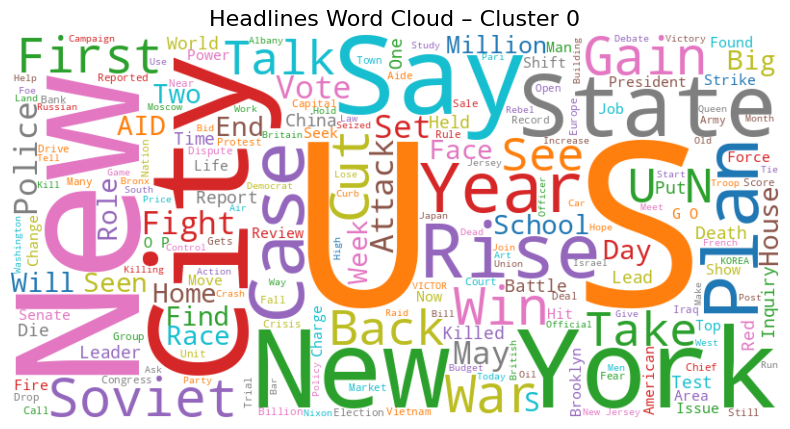

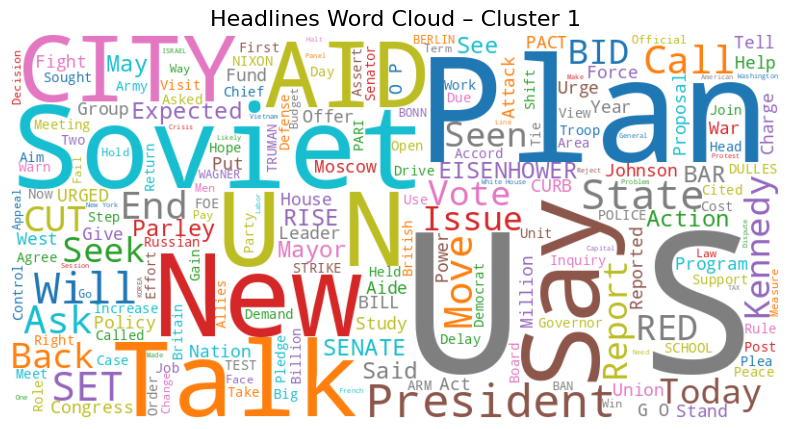

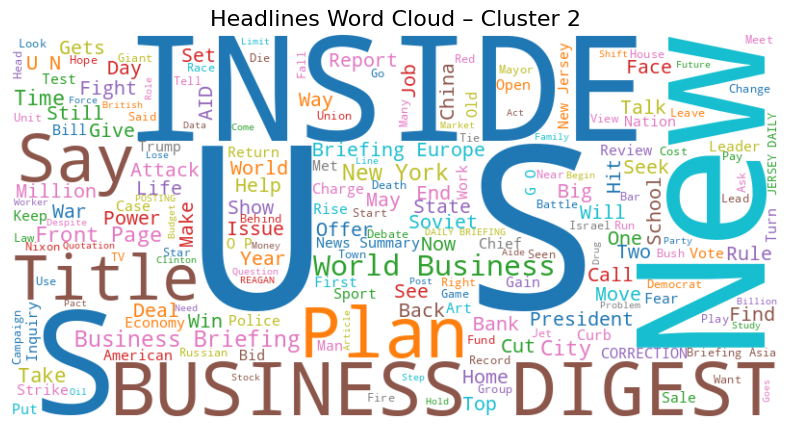

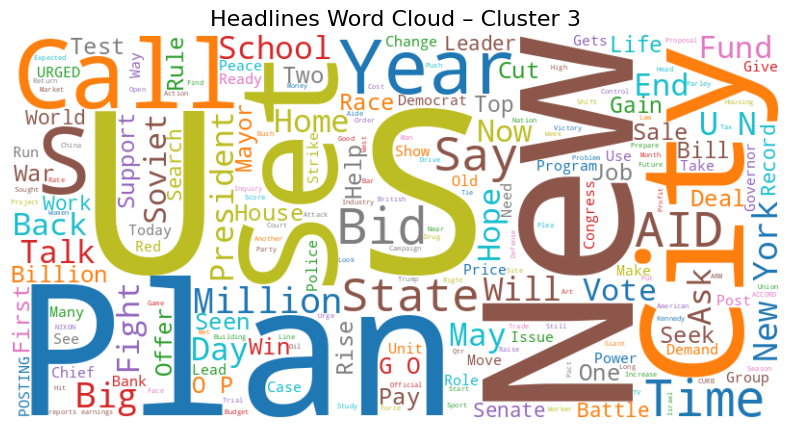

In [ ]:
for cluster_num in sorted(df_filtered["cluster"].unique()):
    # Get all lyrics for this cluster
    cluster_lyrics = df_filtered[df_filtered["cluster"] == cluster_num]["Headlines"].str.cat(sep=" ")

    # Create the word cloud
    wc = WordCloud(width=800, height=400, background_color='white', colormap='tab10').generate(cluster_lyrics)

    # Plot it
    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Headlines Word Cloud – Cluster {cluster_num}", fontsize=16)
    plt.show()

In [ ]:
df_filtered.groupby("cluster")["Year"].mean()

,Year
cluster,
0,1986.649316
1,1961.388693
2,1992.527438
3,1989.471502


<ipython-input-10-a540814a2b25>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Year', y='cluster', data=df, size=10, palette='Set2', orient='h')


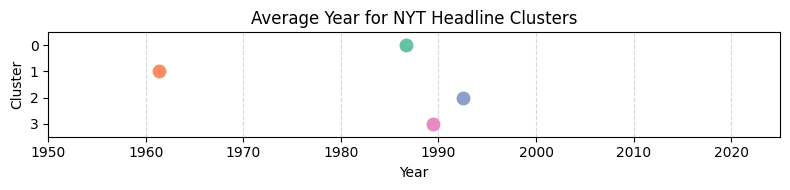

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define the data
data = {
    'cluster': [0, 1, 2, 3],
    'Year': [1986.64931, 1961.38869, 1992.52743, 1989.47150]
}
df = pd.DataFrame(data)

# Plot
plt.figure(figsize=(8, 2))
sns.stripplot(x='Year', y='cluster', data=df, size=10, palette='Set2', orient='h')
plt.title("Average Year for NYT Headline Clusters")
plt.xlim(1950, 2025)
plt.xlabel("Year")
plt.ylabel("Cluster")
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

In [ ]:
full_emotions_df = pd.read_csv("https://raw.githubusercontent.com/anyabulchandani/DS112FinalProj/refs/heads/main/Complete_Emotion_df.csv")
emotion_df = full_emotions_df.loc[:, "Headline_Text_trust":]
emotion_df

,Headline_Text_trust,Headline_Text_fear,Headline_Text_negative,Headline_Text_sadness,Headline_Text_anger,Headline_Text_surprise,Headline_Text_positive,Headline_Text_disgust,Headline_Text_joy,Headline_Text_anticipation
0,0.306243,0.223666,0.350057,0.127412,0.182690,0.078490,0.435414,0.050738,0.110159,0.239614
1,0.310037,0.236767,0.360855,0.133261,0.199650,0.073330,0.429115,0.056853,0.114672,0.233689
2,0.326386,0.225341,0.353183,0.134368,0.190054,0.079062,0.437251,0.056003,0.122838,0.226861
3,0.325677,0.217474,0.347163,0.140610,0.190883,0.075499,0.440883,0.054784,0.123754,0.236111
4,0.325397,0.199271,0.344457,0.139544,0.179591,0.078993,0.440928,0.050368,0.117113,0.244272
...,...,...,...,...,...,...,...,...,...,...
70,0.256078,0.265802,0.403797,0.179440,0.182218,0.148182,0.386201,0.075712,0.139616,0.201899
71,0.248382,0.267546,0.394475,0.183673,0.190393,0.125187,0.423843,0.079393,0.159283,0.221005
72,0.248211,0.299335,0.412321,0.186350,0.216513,0.120910,0.395450,0.094070,0.151074,0.219581
73,0.252853,0.285062,0.401471,0.187421,0.203145,0.124524,0.414659,0.090033,0.158509,0.210753


In [ ]:
emotion_cols = ["Headline_Text_trust",	"Headline_Text_fear",	"Headline_Text_negative",	"Headline_Text_sadness",	"Headline_Text_anger",	"Headline_Text_surprise",	"Headline_Text_positive",	"Headline_Text_disgust",	"Headline_Text_joy",	"Headline_Text_anticipation"]
merged = pd.merge(
    emotion_df,
    df_filtered["cluster"],
    left_index=True,
    right_index=True,
    how='inner'  # or 'outer', 'left', 'right'
)
mean_headline_emotions = merged.groupby("cluster")[emotion_cols].mean()

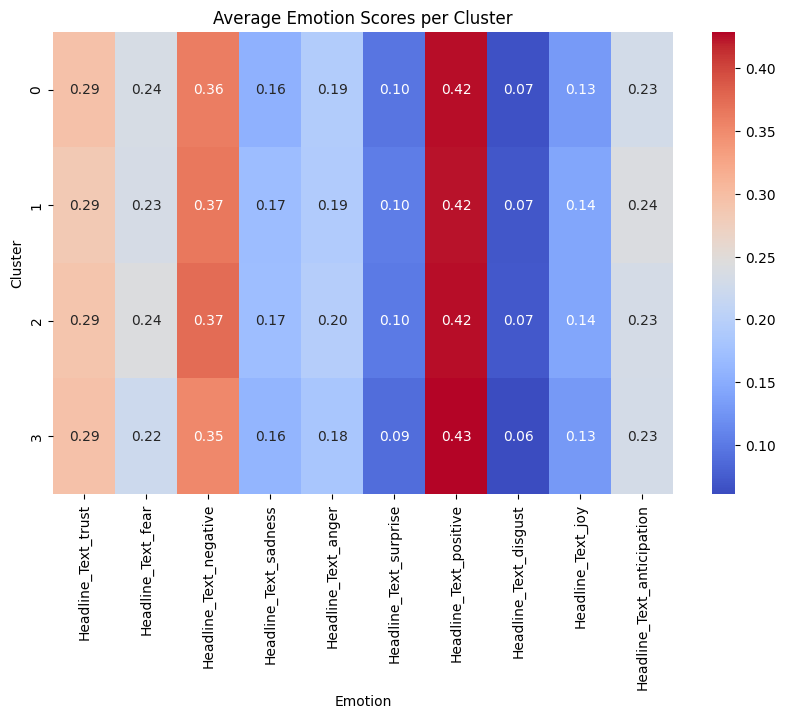

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.heatmap(mean_headline_emotions, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Average Emotion Scores per Cluster")
plt.xlabel("Emotion")
plt.ylabel("Cluster")
plt.show()

### track words over time

In [ ]:
df_lyrics["mentions_gun"] = df_lyrics["clean"].str.contains(r"\bgun\b")
df_headlines["mentions_gun"] = df_headlines["clean"].str.contains(r"\bgun\b")
gun_lyrics_by_decade = df_lyrics.groupby("Release Year")["mentions_gun"].sum()
gun_headlines_by_decade = df_headlines.groupby("Year")["mentions_gun"].sum()
total_lyrics_by_decade = df_lyrics.groupby("Release Year").size()
gun_rate_lyrics = gun_lyrics_by_decade / total_lyrics_by_decade
total_headlines_by_decade = df_headlines.groupby("Year").size()
gun_rate_headlines = gun_headlines_by_decade / total_headlines_by_decade

df_sou["mentions_gun"] = df_sou["clean"].str.count(r"\bgun\b", flags=re.IGNORECASE)
gun_sou_by_year = df_sou.groupby("Year")["mentions_gun"].sum()
total_words_by_year = df_sou.groupby("Year")["clean"].apply(lambda x: x.str.split().str.len().sum())
gun_rate_sou = 10 * gun_sou_by_year / total_words_by_year

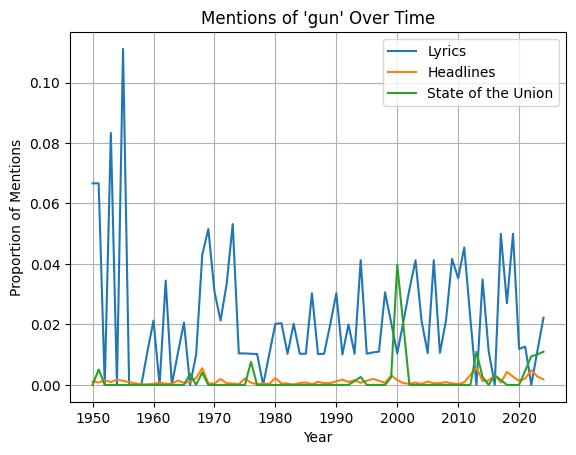

In [ ]:
import matplotlib.pyplot as plt

plt.plot(gun_rate_lyrics.index, gun_rate_lyrics.values, label="Lyrics")
plt.plot(gun_rate_headlines.index, gun_rate_headlines.values, label="Headlines")
plt.plot(gun_rate_sou.index, gun_rate_sou.values, label="State of the Union")
plt.title("Mentions of 'gun' Over Time")
plt.xlabel("Year")
plt.ylabel("Proportion of Mentions")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
df_lyrics["mentions_war"] = df_lyrics["clean"].str.contains(r"\bwar\b")
df_headlines["mentions_war"] = df_headlines["clean"].str.contains(r"\bwar\b")
war_lyrics_by_decade = df_lyrics.groupby("decade")["mentions_war"].sum()
war_headlines_by_decade = df_headlines.groupby("decade")["mentions_war"].sum()
total_lyrics_by_decade = df_lyrics.groupby("decade").size()
war_rate_lyrics = war_lyrics_by_decade / total_lyrics_by_decade
total_headlines_by_decade = df_headlines.groupby("decade").size()
war_rate_headlines = war_headlines_by_decade / total_headlines_by_decade


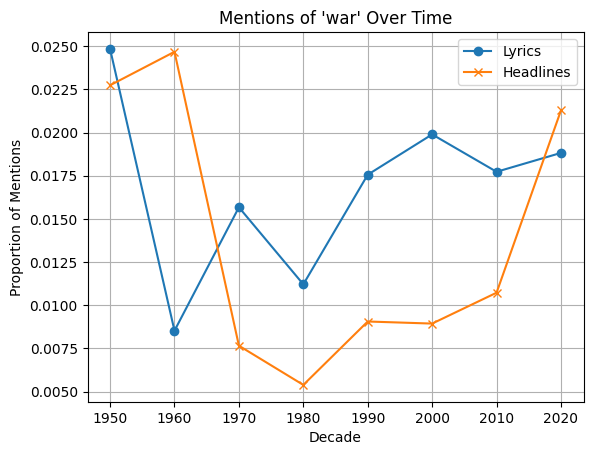

In [ ]:
import matplotlib.pyplot as plt

plt.plot(gun_rate_lyrics.index, war_rate_lyrics.values, label="Lyrics", marker='o')
plt.plot(gun_rate_headlines.index, war_rate_headlines.values, label="Headlines", marker='x')
plt.title("Mentions of 'war' Over Time")
plt.xlabel("Decade")
plt.ylabel("Proportion of Mentions")
plt.legend()
plt.grid(True)
plt.show()


### lda analysis

#### lyrics

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import numpy as np


In [ ]:
pre_df = df_lyrics[df_lyrics["Release Year"] < 1980]
post_df = df_lyrics[df_lyrics["Release Year"] >= 1980]

In [ ]:
vectorizer = CountVectorizer(stop_words="english", max_features=5000)
X_pre = vectorizer.fit_transform(pre_df["clean"])
X_post = vectorizer.transform(post_df["clean"])  # use same vocab

In [ ]:
lda = LatentDirichletAllocation(n_components=10, random_state=42)
lda.fit(X_pre)

topic_distr_pre = lda.transform(X_pre)
topic_distr_post = lda.transform(X_post)

In [ ]:
avg_pre = topic_distr_pre.mean(axis=0)
avg_post = topic_distr_post.mean(axis=0)

similarity = cosine_similarity([avg_pre], [avg_post])[0][0]
print(f"Cosine similarity between pre-2000 and post-2000 LDA topics: {similarity:.3f}")

Cosine similarity between pre-2000 and post-2000 LDA topics: 0.947


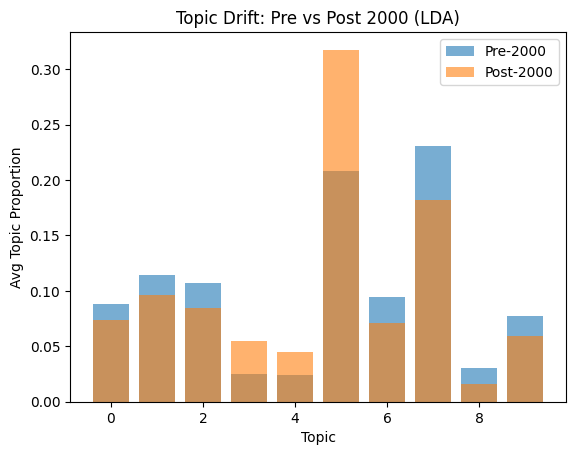

In [ ]:
plt.bar(range(10), avg_pre, alpha=0.6, label="Pre-2000")
plt.bar(range(10), avg_post, alpha=0.6, label="Post-2000")
plt.xlabel("Topic")
plt.ylabel("Avg Topic Proportion")
plt.title("Topic Drift: Pre vs Post 2000 (LDA)")
plt.legend()
plt.show()

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import numpy as np

split_years = list(range(1960, 2015, 5))
similarities = []

for split in split_years:
    pre_df = df_lyrics[df_lyrics["Release Year"] < split]
    post_df = df_lyrics[df_lyrics["Release Year"] >= split]

    # Skip splits that don't give enough data
    if len(pre_df) < 5 or len(post_df) < 5:
        similarities.append(np.nan)
        continue

    vectorizer = CountVectorizer(stop_words="english", max_features=5000)
    X_pre = vectorizer.fit_transform(pre_df["clean"])
    X_post = vectorizer.transform(post_df["clean"])

    lda = LatentDirichletAllocation(n_components=10, random_state=42)
    lda.fit(X_pre)

    topic_distr_pre = lda.transform(X_pre)
    topic_distr_post = lda.transform(X_post)

    avg_pre = topic_distr_pre.mean(axis=0)
    avg_post = topic_distr_post.mean(axis=0)

    similarity = cosine_similarity([avg_pre], [avg_post])[0][0]
    similarities.append(similarity)


ValueError: x and y must have same first dimension, but have shapes (11,) and (6,)

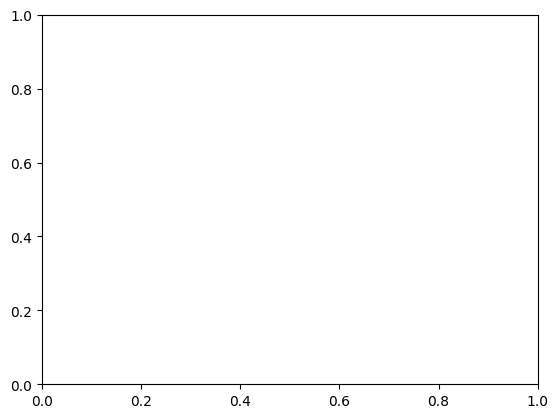

In [ ]:
lyric_similarities = similarities
plt.plot(split_years, lyric_similarities, marker='o')
plt.title("LDA Topic Similarity (Pre/Post Split) Over Time")
plt.xlabel("Split Year")
plt.ylabel("Cosine Similarity")
plt.ylim(0, 1.05)
plt.grid(True)
plt.show()


#### sou

In [ ]:
pre_df = df_sou[df_sou["Year"] < 2000]
post_df = df_sou[df_sou["Year"] >= 2000]

In [ ]:
vectorizer = CountVectorizer(stop_words="english", max_features=5000)
X_pre = vectorizer.fit_transform(pre_df["clean"])
X_post = vectorizer.transform(post_df["clean"])  # use same vocab

In [ ]:
lda = LatentDirichletAllocation(n_components=10, random_state=42)
lda.fit(X_pre)

topic_distr_pre = lda.transform(X_pre)
topic_distr_post = lda.transform(X_post)

In [ ]:
avg_pre = topic_distr_pre.mean(axis=0)
avg_post = topic_distr_post.mean(axis=0)

similarity = cosine_similarity([avg_pre], [avg_post])[0][0]
print(f"Cosine similarity between pre-2000 and post-2000 LDA topics: {similarity:.3f}")

Cosine similarity between pre-2000 and post-2000 LDA topics: 0.993


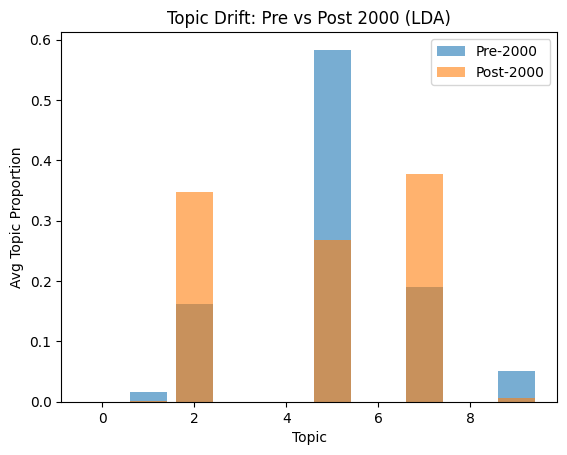

In [ ]:
plt.bar(range(10), avg_pre, alpha=0.6, label="Pre-2000")
plt.bar(range(10), avg_post, alpha=0.6, label="Post-2000")
plt.xlabel("Topic")
plt.ylabel("Avg Topic Proportion")
plt.title("Topic Drift: Pre vs Post 2000 (LDA)")
plt.legend()
plt.show()

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import numpy as np

split_years = list(range(1960, 2015, 5))
similarities = []

for split in split_years:
    pre_df = df_sou[df_sou["Year"] < split]
    post_df = df_sou[df_sou["Year"] >= split]

    # Skip splits that don't give enough data
    if len(pre_df) < 5 or len(post_df) < 5:
        similarities.append(np.nan)
        continue

    vectorizer = CountVectorizer(stop_words="english", max_features=5000)
    X_pre = vectorizer.fit_transform(pre_df["clean"])
    X_post = vectorizer.transform(post_df["clean"])

    lda = LatentDirichletAllocation(n_components=10, random_state=42)
    lda.fit(X_pre)

    topic_distr_pre = lda.transform(X_pre)
    topic_distr_post = lda.transform(X_post)

    avg_pre = topic_distr_pre.mean(axis=0)
    avg_post = topic_distr_post.mean(axis=0)

    similarity = cosine_similarity([avg_pre], [avg_post])[0][0]
    similarities.append(similarity)


KeyboardInterrupt: 

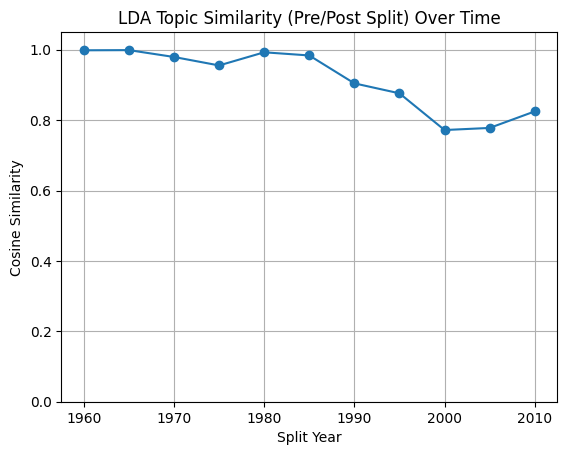

In [ ]:
plt.plot(split_years, similarities, marker='o')
plt.title("LDA Topic Similarity (Pre/Post Split) Over Time")
plt.xlabel("Split Year")
plt.ylabel("Cosine Similarity")
plt.ylim(0, 1.05)
plt.grid(True)
plt.show()


#### headlines

In [ ]:
pre_df = df_headlines[df_headlines["Year"] < 2000]
post_df = df_headlines[df_headlines["Year"] >= 2000]

In [ ]:
vectorizer = CountVectorizer(stop_words="english", max_features=5000)
X_pre = vectorizer.fit_transform(pre_df["clean"])
X_post = vectorizer.transform(post_df["clean"])  # use same vocab

In [ ]:
lda = LatentDirichletAllocation(n_components=10, random_state=42)
lda.fit(X_pre)

topic_distr_pre = lda.transform(X_pre)
topic_distr_post = lda.transform(X_post)

In [ ]:
avg_pre = topic_distr_pre.mean(axis=0)
avg_post = topic_distr_post.mean(axis=0)

similarity = cosine_similarity([avg_pre], [avg_post])[0][0]
print(f"Cosine similarity between pre-2000 and post-2000 LDA topics: {similarity:.3f}")

Cosine similarity between pre-2000 and post-2000 LDA topics: 0.976


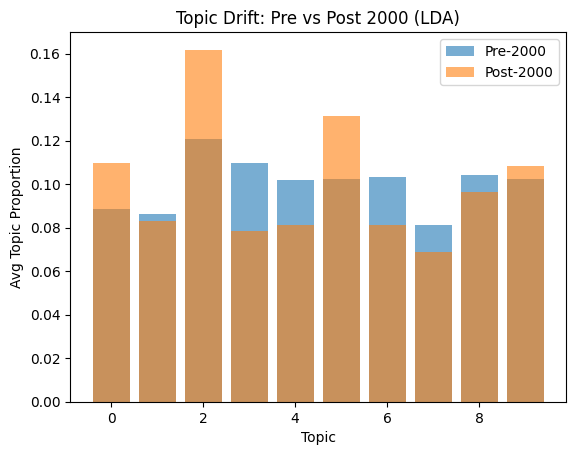

In [ ]:
plt.bar(range(10), avg_pre, alpha=0.6, label="Pre-2000")
plt.bar(range(10), avg_post, alpha=0.6, label="Post-2000")
plt.xlabel("Topic")
plt.ylabel("Avg Topic Proportion")
plt.title("Topic Drift: Pre vs Post 2000 (LDA)")
plt.legend()
plt.show()